# Sailbuoy

Notebook to deal with all the Sailbuoy data

## Importing the required libraries

In [ ]:
%matplotlib inline
%pylab inline
import xarray as xr
import pandas as pd
import datetime
import glob
import matplotlib.dates as mdates
import gsw
import glidertools as gt
from tqdm.notebook import tqdm_notebook as tqdm
from cmocean import cm as cmo  
import os
import pathlib
from matplotlib.ticker import MaxNLocator
import geomag
import cartopy.crs as ccrs
import matplotlib
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.image as mpimg
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import scipy
import numpy as np
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import seaborn as sns
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.animation import FuncAnimation
import cartopy.feature as cfeature
import scipy.signal as sg  #Package for signal analysis
import scipy.ndimage as si #Another package for signal analysis
#from scipy.interpolate import interp1d  #for converting cell to grid-centered coordinates
#from scipy import stats    #Used for 2D binned statistics
#from mpl_toolkits.axes_grid1 import make_axes_locatable #For plotting interior colobars
#import cartopy.crs as ccrs
from scipy import stats
#from scipy import signal, ndimage
from scipy import fft as spfft
from scipy.fft import fft 
from scipy.stats import chi2
from scipy.special import digamma
#function for coverting Matlab's datenum into Python's datetime
#from https://gist.github.com/victorkristof/b9d794fe1ed12e708b9d
#with modifications to support array input and output

mpl.rcParams['animation.ffmpeg_path'] = r"/Users/xedhjo/Documents/Python/extra/ffmpeg"

font = {'family' : 'Avenir',
        'weight' : 'normal',
        'size'   : 20}
matplotlib.rc('font', **font)

mpl.rcParams['xtick.major.size'] = 8
mpl.rcParams['xtick.major.width'] = 1
mpl.rcParams['xtick.minor.size'] = 4
mpl.rcParams['xtick.minor.width'] = 1
mpl.rcParams['ytick.major.size'] = 8
mpl.rcParams['ytick.major.width'] = 1
mpl.rcParams['ytick.minor.size'] = 4
mpl.rcParams['ytick.minor.width'] = 1

from IPython.display import display, Markdown

def print_with_font_size(text, fs=20):
    # Format the output with the desired font size
    print_output = f"<span style='font-size: {fs}px;'>{text}</span>"
    display(Markdown(print_output))

print = print_with_font_size

def rot_ticks(axs,rot,ha):
    for xlabels in axs.get_xticklabels():
                xlabels.set_rotation(rot)
                xlabels.set_ha(ha)
                
def time_ticks_h(ax,interval=[0,6,12,18]):
    ax.xaxis.set_minor_locator(mdates.HourLocator(interval))
    ax.xaxis.set_minor_formatter(mdates.DateFormatter("%H:%M"))
    ax.xaxis.set_major_locator(mdates.DayLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M\n%d %b"))
    
def time_ticks_d(ax,majint,minint):
    ax.xaxis.set_minor_locator(mdates.HourLocator(minint))
    ax.xaxis.set_minor_formatter(mdates.DateFormatter(""))
    ax.xaxis.set_major_locator(mdates.DayLocator(majint))
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%d %b"))
    
def gridlines(ax,lon_tick,lat_tick):
    
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      x_inline=False, y_inline=False,
                  linewidth=0.75, alpha=0.5, linestyle='--',ylocs = matplotlib.ticker.MultipleLocator(base=lat_tick),xlocs = matplotlib.ticker.MultipleLocator(base=lon_tick))
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    gl.xpadding=10
    gl.ypadding=10
    
def corfreq(lat):
    """
    The Coriolis frequency in rad / day at a given latitude.
    
    Parameters
    ----------
        lat: Latitude in degree
        
    Returns:
        The Coriolis frequecy at latitude lat
    """    
    omega=7.2921159e-5;
    return 2*np.sin(lat*2*np.pi/360)*omega*(3600)*24


def fix_xticks(ax,ds):
    
    if (ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') < 1 :
        ax[0].xaxis.set_minor_locator(mdates.HourLocator())
        ax[0].xaxis.set_major_locator(mdates.HourLocator(np.arange(0,24,3)))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter(""))
        #ax[3].set_xlabel(f"{ds.time[0].values.astype('datetime64[D]')}",loc='left')

    if ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') > 1) and ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') < 7):
        ax[0].xaxis.set_minor_locator(mdates.HourLocator([0,12]))
        ax[0].xaxis.set_major_locator(mdates.DayLocator(np.arange(1,32,1)))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%b"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%H:%M"))

    if ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') > 6) and ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') < 15):
        ax[0].xaxis.set_minor_locator(mdates.DayLocator(np.arange(1,32,1)))
        ax[0].xaxis.set_major_locator(mdates.DayLocator(np.arange(2,32,2)))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%b"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter(""))
        ax[-1].set_xlabel('2023')

    if ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') > 14) and ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') < 31):
        ax[0].xaxis.set_minor_locator(mdates.DayLocator(np.arange(1,32,1)))
        ax[0].xaxis.set_major_locator(mdates.DayLocator([5,10,15,20,25,30]))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%b"))
        #ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%d"))

    if ((ds.time[-1] - ds.time[0]).data.astype('timedelta64[D]') > 30):
        ax[0].xaxis.set_major_locator(mdates.MonthLocator())
        ax[0].xaxis.set_minor_locator(mdates.DayLocator([1,5,10,15,20,25]))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%B"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%d"))
    
    rot_ticks(ax[-1],0,'center')



wind_c2 = ListedColormap(['#FCC681','#FF819E','#FF819E','#A0A3E0','#A0A3E0','#99D4E5','#99D4E5','#FCC681']) # Soft pastels, use this

kc = '#006699'
sdc = '#ff6600'
ppc = 'crimson'

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## Loading the data

In [1]:
def calc_mag_dec(ds): 

    mag_dec = np.empty(len(ds['time']), dtype=float)

    for i in range(len(ds.time)):
        mag_dec[i] = geomag.declination(ds.latitude[i],ds.longitude[i])    

    return mag_dec

In [2]:
######## Kringla SO-CHIC ########
sb_s = xr.open_dataset('/Users/xedhjo/Documents/Projects/SO-CHIC/data/DATA.nc')
sb_s = sb_s.sortby('time').sel(time=slice('2021','2022-07-17'))
sb_s['doy'] = xr.DataArray(mdates.date2num(sb_s['time']) - mdates.date2num(np.datetime64('2022-01-02')),dims='time')
sb_s['mday'] = xr.DataArray(mdates.date2num(sb_s['time']) - mdates.date2num(sb_s['time'].values[0]),dims='time')
sb_s = sb_s.set_coords('doy')
sb_s['airmar_heading'] = sb_s['airmar_heading'] + calc_mag_dec(sb_s)

######## Kringla QUICCHE ########
sb_k = xr.open_dataset('/Users/xedhjo/Documents/Projects/QUICCHE/data/Kringla_QUICCHE_data.nc')
sb_k['doy'] = xr.DataArray(mdates.date2num(sb_k['time']) - mdates.date2num(np.datetime64('2023-01-02')),dims='time')
sb_k['mday'] = xr.DataArray(mdates.date2num(sb_k['time']) - mdates.date2num(sb_k['time'].values[0]),dims='time')
sb_k = sb_k.set_coords('doy')
sb_k['airmar_heading'] = sb_k['airmar_heading'] + calc_mag_dec(sb_k)

######## PimPim QUICCHE ########
sb_pp = xr.open_dataset('/Users/xedhjo/Documents/Projects/QUICCHE/data/sailbuoy/PimPim/full/DATA.nc')
sb_pp['doy'] = xr.DataArray(mdates.date2num(sb_pp['time']) - mdates.date2num(np.datetime64('2023-01-02')),dims='time')
sb_pp['mday'] = xr.DataArray(mdates.date2num(sb_pp['time']) - mdates.date2num(sb_pp['time'].values[0]),dims='time')
sb_pp = sb_pp.set_coords('doy')

sb_pp1 = xr.open_dataset('/Users/xedhjo/Documents/Projects/QUICCHE/data/sailbuoy/PimPim/First_deployment/DATA.nc')
sb_pp1['doy'] = xr.DataArray(mdates.date2num(sb_pp1['time']) - mdates.date2num(np.datetime64('2023-01-02')),dims='time')
sb_pp1['mday'] = xr.DataArray(mdates.date2num(sb_pp1['time']) - mdates.date2num(sb_pp1['time'].values[0]),dims='time')
sb_pp1 = sb_pp1.set_coords('doy')

######## SD1067 SO-CHIC ########
sd1067 = xr.open_mfdataset('/Users/xedhjo/Documents/Projects/saildrone/sd-1067/daily_files/1min/saildrone*.nc',combine='nested', concat_dim='obs').load().squeeze().swap_dims({'obs':'time'})
sd1067['doy'] = xr.DataArray(mdates.date2num(sd1067['time']) - mdates.date2num(np.datetime64('2022-01-02')),dims='time')
sd1067['mday'] = xr.DataArray(mdates.date2num(sd1067['time']) - mdates.date2num(sd1067['time'].values[0]),dims='time')
sd1067 = sd1067.set_coords('doy')

In [3]:
tmp = []
ctd_files = glob.glob('/Volumes/MASSIVEUNIT/Data/QUICCHE/Ship drive copy/metacq/data/2303*.MET')

for i in range(len(ctd_files)-1):
    df = pd.read_csv(ctd_files[i+1],skiprows=3,delim_whitespace=True)
    df['time'] = mdates.num2date([mdates.date2num(np.datetime64(f'2023-03-{str(5+i).zfill(2)}'))]*df.shape[0] + df.index.values/86400)
    tmp.append(df)
df = pd.concat(tmp)

df['time'] = df['time'].dt.tz_localize(None).astype('datetime64[s]')
df = df.set_index('time')
ds = df.to_xarray()
ds = ds.resample(time='10min').mean()

ds['doy'] = xr.DataArray(mdates.date2num(ds['time']) - mdates.date2num(np.datetime64('2023-01-02')),dims='time')
ds['mday'] = xr.DataArray(mdates.date2num(ds['time']) - mdates.date2num(ds['time'].values[0]),dims='time')
ds = ds.set_coords('doy')

## Some stats

In [3]:
def print_stats(ds,name):
    
    print(name,fs=30)
    print(f"{ds.time.values[0].astype('datetime64[s]')} and {ds.time.values[-1].astype('datetime64[s]')}")
    print(f"Latitudinal range: {np.nanmin(ds.latitude.values).round(3)} to {np.nanmax(ds.latitude.values).round(3)}")
    print(f"Longitudinal range: {np.nanmin(ds.longitude.values).round(3)} to {np.nanmax(ds.longitude.values).round(3)}")
    print(f"Datapoints: {len(ds.time)}")
    print(f"Total distance: {gsw.distance(ds.longitude,ds.latitude).sum().round(0)/1000} km")
    print(r"Δλ: {} ± {} m".format(gsw.distance(ds.longitude,ds.latitude).mean().round(0),gsw.distance(ds.longitude,ds.latitude).std().round(0)))
    print(r"Δt: {} ".format(ds.time.diff('time').values.astype('timedelta64[m]').mean()))

In [4]:
print_stats(sb_s,"SO-CHIC Kringla deployment")
print_stats(sd1067,"SO-CHIC SD1067 deployment")
print_stats(sb_k,"QUICCHE Kringla deployment")
print_stats(sb_pp1,"QUICCHE PimPim first deployment")
print_stats(sb_pp,"QUICCHE PimPim main deployment")


<span style='font-size: 30px;'>SO-CHIC Kringla deployment</span>

<span style='font-size: 20px;'>2022-01-10T11:09:11 and 2022-07-17T15:30:00</span>

<span style='font-size: 20px;'>Latitudinal range: -66.52 to -53.475</span>

<span style='font-size: 20px;'>Longitudinal range: -1.328 to 6.14</span>

<span style='font-size: 20px;'>Datapoints: 19512</span>

<span style='font-size: 20px;'>Total distance: 10170.7 km</span>

<span style='font-size: 20px;'>Δλ: 521.0 ± 2005.0 m</span>

<span style='font-size: 20px;'>Δt: 13 minutes </span>

<span style='font-size: 30px;'>SO-CHIC SD1067 deployment</span>

<span style='font-size: 20px;'>2022-08-24T00:00:00 and 2022-11-22T23:59:00</span>

<span style='font-size: 20px;'>Latitudinal range: -43.357 to -34.001</span>

<span style='font-size: 20px;'>Longitudinal range: 7.952 to 18.918</span>

<span style='font-size: 20px;'>Datapoints: 131040</span>

<span style='font-size: 20px;'>Total distance: nan km</span>

<span style='font-size: 20px;'>Δλ: nan ± nan m</span>

<span style='font-size: 20px;'>Δt: 1 minutes </span>

<span style='font-size: 30px;'>QUICCHE Kringla deployment</span>

<span style='font-size: 20px;'>2023-03-06T11:20:00 and 2023-05-04T04:40:00</span>

<span style='font-size: 20px;'>Latitudinal range: -37.933 to -33.324</span>

<span style='font-size: 20px;'>Longitudinal range: 16.054 to 19.962</span>

<span style='font-size: 20px;'>Datapoints: 8456</span>

<span style='font-size: 20px;'>Total distance: 3269.984 km</span>

<span style='font-size: 20px;'>Δλ: 387.0 ± 216.0 m</span>

<span style='font-size: 20px;'>Δt: 10 minutes </span>

<span style='font-size: 30px;'>QUICCHE PimPim first deployment</span>

<span style='font-size: 20px;'>2023-03-09T14:20:00 and 2023-03-10T07:30:00</span>

<span style='font-size: 20px;'>Latitudinal range: -32.82 to -32.675</span>

<span style='font-size: 20px;'>Longitudinal range: 15.0 to 15.116</span>

<span style='font-size: 20px;'>Datapoints: 104</span>

<span style='font-size: 20px;'>Total distance: 27.696 km</span>

<span style='font-size: 20px;'>Δλ: 269.0 ± 93.0 m</span>

<span style='font-size: 20px;'>Δt: 10 minutes </span>

<span style='font-size: 30px;'>QUICCHE PimPim main deployment</span>

<span style='font-size: 20px;'>2023-03-22T05:50:00 and 2023-05-23T05:30:00</span>

<span style='font-size: 20px;'>Latitudinal range: -40.015 to -34.137</span>

<span style='font-size: 20px;'>Longitudinal range: 14.311 to 20.131</span>

<span style='font-size: 20px;'>Datapoints: 8846</span>

<span style='font-size: 20px;'>Total distance: 3636.792 km</span>

<span style='font-size: 20px;'>Δλ: 411.0 ± 245.0 m</span>

<span style='font-size: 20px;'>Δt: 10 minutes </span>

Text(-39.5, 23, '$\\Delta$1.75')

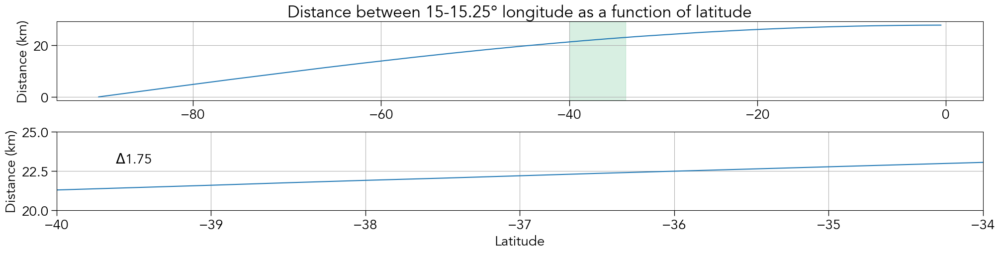

In [1144]:
fig,(ax,bx) = plt.subplots(2,1,figsize=(20,5),constrained_layout=True)

lats = np.arange(-90,0,0.5)
dist = np.zeros((len(lats)))
for i,l in enumerate(lats):
    dist[i] = (gsw.distance([15,15.25],[l,l])[0]/1000).round(2)
    
ax.plot(lats,dist)
ax.set(ylabel=('Distance (km)'),title='Distance between 15-15.25° longitude as a function of latitude', xlabel='')
ax.grid()

y_limits = ax.get_ylim()
ax.fill([-40, -34, -34, -40, -40], [y_limits[0], y_limits[0], y_limits[1], y_limits[1], y_limits[0]], color='mediumseagreen', alpha=0.2)
ax.set_ylim(y_limits)

bx.plot(lats,dist)
bx.set(ylabel=('Distance (km)'), xlabel='Latitude', xlim=(-40,-34), ylim=(20,25))
bx.grid()

bx.text(-39.5,23,"$\Delta$" + str((dist[np.where(lats==-34)] - dist[np.where(lats==-40)])[0]), ha='center')

## Checking distance to ship

In [444]:
# Helper function to calculate distance
def calculate_distance(ds, sb):
    dist = []
    for i in range(len(ds.time)):
        dist.append(gsw.distance([ds['LO'][i], sb['longitude'][i]], [ds['LA'][i], sb['latitude'][i]])[0] / 1000)
    return dist

# Select data based on time values in sb_k
mt_k = [time for time in ds.time.values if time in sb_k.time.values]
ds_k = ds.sel(time=mt_k)
dist_k = calculate_distance(ds_k, sb_k)
ds_k['dts'] = ('time', dist_k)

# Select data based on time values in sb_pp
mt_pp = [time for time in ds.time.values if time in sb_pp.time.values]
ds_pp = ds.sel(time=mt_pp)
dist_pp = calculate_distance(ds_pp, sb_pp)
ds_pp['dts'] = ('time', dist_pp)

# Select data based on time values in sb_pp1
mt_pp1 = [time for time in ds.time.values if time in sb_pp1.time.values]
ds_pp1 = ds.sel(time=mt_pp1)
dist_pp1 = calculate_distance(ds_pp1, sb_pp1)
ds_pp1['dts'] = ('time', dist_pp1)

[Text(0, 0.5, 'Distance (km)')]

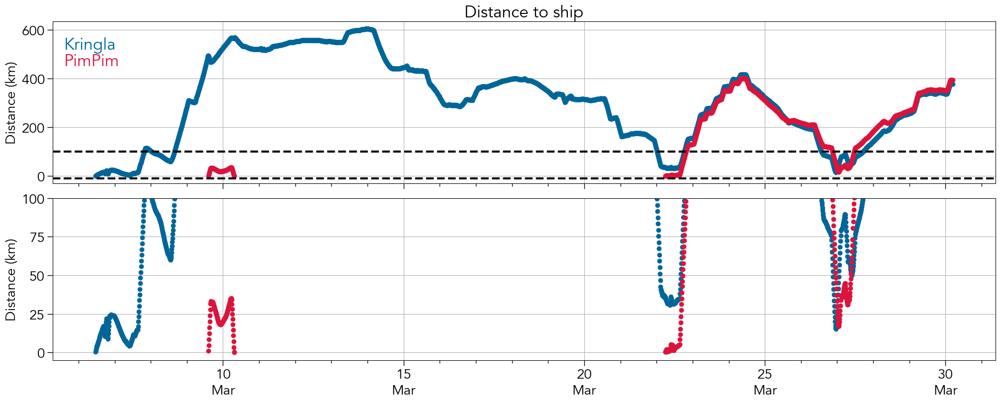

In [77]:
fig, (ax, bx) = plt.subplots(2, 1, figsize=(20, 8), constrained_layout=True, sharex=True)

datasets = [ds_k, ds_pp, ds_pp1]
colors = [kc, ppc, ppc]
axes = [ax, bx]

for subplot in axes:
    for dataset, color in zip(datasets, colors):
        subplot.scatter(dataset.time.values, dataset['dts'], c=color, zorder=2)
    subplot.grid(zorder=1)
    subplot.set(ylabel='Distance (km)')

# Horizontal lines
ax.axhline(-10, ls='--', lw=3, c='k')
ax.axhline(100, ls='--', lw=3, c='k')

# Y-axis limits for bx
bx.set(ylim=(-5, 100))

# Fix x-ticks
fix_xticks([bx], ds_k)

# Titles and labels
ax.set_title('Distance to ship', loc='center', c='k')
ax.set_title('Kringla', loc='left', y=0.8, x=0.012, c=kc)
ax.set_title('PimPim', loc='right', y=0.7, x=0.012, c=ppc, ha='left')
bx.set(ylabel='Distance (km)')

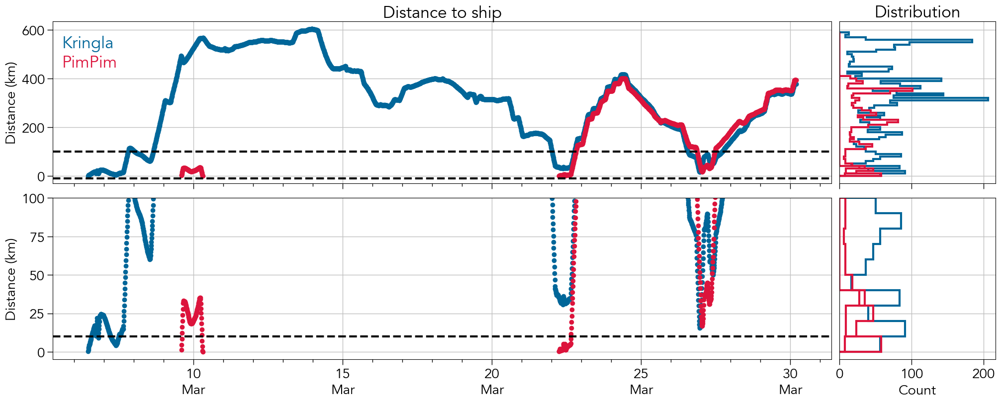

In [134]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Define the grid layout using gridspec
fig = plt.figure(figsize=(20, 8), constrained_layout=True)
gs = fig.add_gridspec(2, 6)

# Define the main subplots using gridspec
ax = fig.add_subplot(gs[0, :5])
hist_ax = fig.add_subplot(gs[0, 5], sharey=ax)
bx = fig.add_subplot(gs[1, :5], sharex=ax)
hist_ax2 = fig.add_subplot(gs[1, 5], sharey=bx, sharex=hist_ax)

# Define the datasets and colors
datasets = [ds_k, ds_pp, ds_pp1]
colors = [kc, ppc, ppc]

# Define the bin edges for the histogram
bins1 = np.arange(0, 600, 10)
bins2 = np.arange(0, 101, 10)

# Scatter plots and histograms for the main subplots
for dataset, color in zip(datasets, colors):
    ax.scatter(dataset.time.values, dataset['dts'], c=color, zorder=2)
    bx.scatter(dataset.time.values, dataset['dts'], c=color, zorder=2)
    hist_ax.hist(dataset['dts'], bins=bins1, color=color, edgecolor=color, orientation='horizontal', histtype='step', lw=3)
    hist_ax2.hist(dataset['dts'], bins=bins2, color=color, edgecolor=color, orientation='horizontal', histtype='step', lw=3)

# Horizontal lines
ax.axhline(-10, ls='--', lw=3, c='k')
ax.axhline(100, ls='--', lw=3, c='k')
bx.axhline(10 , ls='--', lw=3, c='k')

# Fix x-ticks
fix_xticks([bx], ds_k)

# Titles and labels
ax.set_title('Distance to ship', loc='center', c='k')
ax.set_title('Kringla', loc='left', y=0.81, x=0.012, c=kc)
ax.set_title('PimPim', loc='right', y=0.69, x=0.012, c=ppc, ha='left')
ax.set(ylabel='Distance (km)')
bx.set(ylabel='Distance (km)',ylim=(-5, 100))
hist_ax.set(ylabel='', xlabel='', title='Distribution')
hist_ax.set_xticks(np.array([0, 100, 200]), minor=True)
hist_ax2.set(xlabel='Count')

# Remove ticks for subplots
ax.tick_params(bottom=True, labelbottom=False)
hist_ax.tick_params(left=False, labelleft=False, bottom=True, labelbottom=False)
hist_ax2.tick_params(left=False, labelleft=False, bottom=True, labelbottom=True)

# Grid lines
for subplot in [ax, bx, hist_ax, hist_ax2]:
    subplot.grid(axis='both', linestyle='-', linewidth=1, c='silver', zorder=1)

plt.show()


## Does the SB itself distort the wind field?

Compare wind speeds relative to heading - wind dir

In [5]:
def angle_diff(ds,var1,var2):
    return np.angle(np.exp(1j * np.deg2rad(ds[var1])) / np.exp(1j * np.deg2rad(ds[var2].values)), deg=True)

In [6]:
sb_k['hrw'] = ('time'),angle_diff(sb_k,'airmar_heading','wind_dir')
sb_pp['hrw'] = ('time'),angle_diff(sb_pp,'heading','wind_dir')
sb_s['hrw'] = ('time'),angle_diff(sb_s,'airmar_heading','wind_dir')
sb_k['hrc'] = ('time'),angle_diff(sb_k,'airmar_heading','dcps_dir')
sb_pp['hrc'] = ('time'),angle_diff(sb_pp,'heading','dcps_dir')
sb_s['hrc'] = ('time'),angle_diff(sb_s,'airmar_heading','dcps_dir')
sd1067['hrw'] = ('time'),angle_diff(sd1067,'HDG','WIND_FROM_MEAN')
# ds['hrw'] = ('time'),angle_diff(ds,'HDG','WIND_FROM_MEAN')

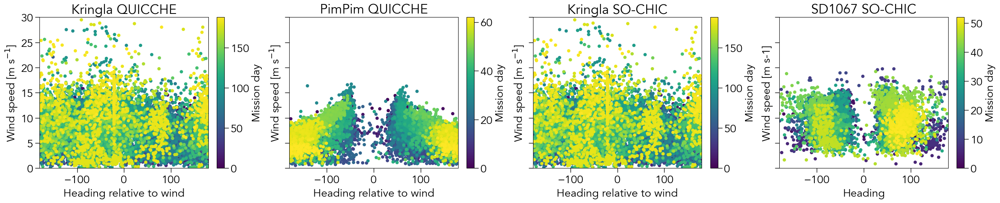

In [178]:
fig, (ax,bx,cx,dx) = plt.subplots(1,4,figsize=(25,5),constrained_layout=True,sharey=True)

dss[0].plot.scatter(x='hrw',y='wind_speed',ax=ax,hue='mday',cbar_kwargs={'label':'Mission day'},ec=None)
ax.set(title='Kringla QUICCHE',ylim=(0,30), xlabel='Heading relative to wind',xlim=(-180,180))

sb_pp.plot.scatter(x='hrw',y='wind_speed',hue='mday',ax=bx,cbar_kwargs={'label':'Mission day'},ec=None)
bx.set(title='PimPim QUICCHE',ylim=(0,30), xlabel='Heading relative to wind',xlim=(-180,180))

sb_s.sel(time='2022').plot.scatter(x='hrw',y='wind_speed',hue='mday',ax=cx,cbar_kwargs={'label':'Mission day'},ec=None)
cx.set(title='Kringla SO-CHIC',ylim=(0,30), xlabel='Heading relative to wind',xlim=(-180,180))

sd1067.sel(time=slice('2022-08','2022-10-14')).plot.scatter(x='hrw',y='WIND_SPEED_MEAN',hue='mday',ax=dx,cbar_kwargs={'label':'Mission day'},ec=None)
dx.set(title='SD1067 SO-CHIC', xlabel='Heading',xlim=(-180,180))

plt.show()

[Text(0.5, 1.0, 'SD1067 SO-CHIC'), Text(0.5, 0, 'Heading')]

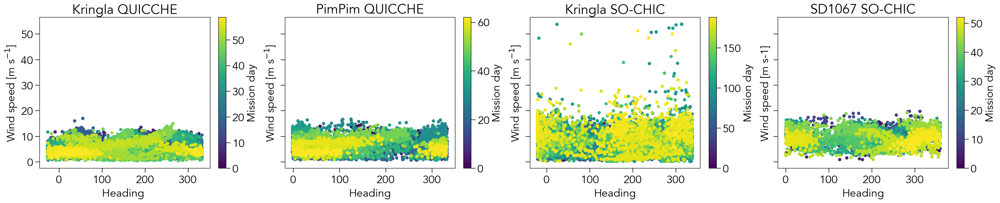

In [110]:
fig, (ax,bx,cx,dx) = plt.subplots(1,4,figsize=(25,5),constrained_layout=True,sharey=True)

sb_k.plot.scatter(x='airmar_heading',y='wind_speed',ax=ax,hue='mday',cbar_kwargs={'label':'Mission day'},ec=None)
ax.set(title='Kringla QUICCHE', xlabel='Heading ')

sb_pp.plot.scatter(x='heading',y='wind_speed',hue='mday',ax=bx,cbar_kwargs={'label':'Mission day'},ec=None)
bx.set(title='PimPim QUICCHE', xlabel='Heading')

sb_s.sel(time='2022').plot.scatter(x='airmar_heading',y='wind_speed',hue='mday',ax=cx,cbar_kwargs={'label':'Mission day'},ec=None)
cx.set(title='Kringla SO-CHIC', xlabel='Heading')

sd1067.sel(time=slice('2022-08','2022-10-14')).plot.scatter(x='HDG',y='WIND_SPEED_MEAN',hue='mday',ax=dx,cbar_kwargs={'label':'Mission day'},ec=None)
dx.set(title='SD1067 SO-CHIC', xlabel='Heading')

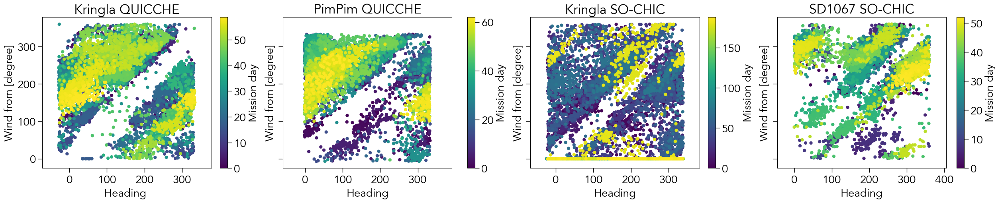

In [153]:
fig, (ax,bx,cx,dx) = plt.subplots(1,4,figsize=(25,5),constrained_layout=True,sharey=True)

sb_k.plot.scatter(x='airmar_heading',y='wind_dir',ax=ax,hue='mday',cbar_kwargs={'label':'Mission day'},ec=None)
ax.set(title='Kringla QUICCHE', xlabel='Heading ')
ax.axis('equal')

sb_pp.plot.scatter(x='heading',y='wind_dir',hue='mday',ax=bx,cbar_kwargs={'label':'Mission day'},ec=None)
bx.set(title='PimPim QUICCHE', xlabel='Heading')
bx.axis('equal')

sb_s.sel(time='2022').plot.scatter(x='airmar_heading',y='wind_dir',hue='mday',ax=cx,cbar_kwargs={'label':'Mission day'},ec=None)
cx.set(title='Kringla SO-CHIC', xlabel='Heading')
cx.axis('equal')

sd1067.sel(time=slice('2022-08','2022-10-14')).plot.scatter(x='HDG',y='WIND_FROM_MEAN',hue='mday',ax=dx,cbar_kwargs={'label':'Mission day'},ec=None)
dx.set(title='SD1067 SO-CHIC', xlabel='Heading')
dx.axis('equal')

plt.show()

In [137]:
sd1067 = sd1067.sel(time=slice('2022-08','2022-10-14')).where(np.isfinite(sd1067['WIND_FROM_MEAN']),drop=True)

In [138]:
def error_bar_percentage(ds, var, ax, da, c, m='s'):
    """
    Plot error bars and scatter points representing the mean and standard deviation
    percentages for a given variable in the dataset.
    
    Args:
        ds (Dataset): Dataset containing the variable.
        var (str): Variable name.
        ax (AxesSubplot): Axes object to plot the error bars and scatter points.
        da (float): Bin width for dividing the data.
        c (str): Color for scatter points.
        m (str): Marker style for scatter points.
    """
    for i in np.arange(-180, 180, da):
        # Select indices where the variable falls within the current bin
        idx = np.where((ds[var] > i) & (ds[var] < i + da))[0]

        # Calculate mean and standard deviation percentages
        mean = np.mean(len(idx)) / len(ds[var].values) * 100
        std = np.std(len(idx)) / len(ds[var].values) * 100

        # Plot error bars and scatter points
        ax.errorbar(i, mean, yerr=std, c='k')
        ax.scatter(i, mean, c=c, zorder=10, marker=m)

In [148]:
def print_percentage(ds,var,i,da):
    """
    Calculate the mean percentage for a given variable in the dataset.
    
    Args:
        ds (Dataset): Dataset containing the variable.
        var (str): Variable name.
        i (float): Starting bin edge.
        da (float): Bin width for dividing the data.
    """
    idx = np.where((ds[var] > i) & (ds[var] < i + da))[0]

    return (np.mean(len(idx))/len(ds[var].values)*100).round(2)

  0%|          | 0/4 [00:00<?, ?it/s]

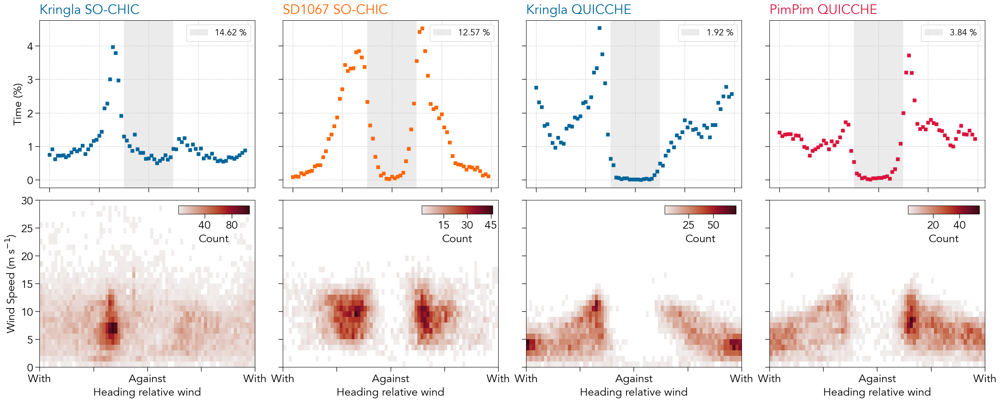

In [695]:
# Create the subplots
fig, [ax,bx] = plt.subplots(2, 4, figsize=(25, 10), constrained_layout=True, sharey='row')

# Define the bin size
da = 5

# Define the datasets, colors, and names
dss = [sb_s, sd1067, sb_k, sb_pp]
cs = [kc, sdc, kc, ppc]
names = ['Kringla SO-CHIC', 'SD1067 SO-CHIC', 'Kringla QUICCHE', 'PimPim QUICCHE']
lbls = []

# Plot error bars and scatter points for each subplot
for i, axs in enumerate(tqdm(ax)):
    error_bar_percentage(dss[i], 'hrw', axs, da, cs[i])
    
    # Set x-ticks and labels
    axs.xaxis.set_ticks([-180, -90, 0, 90, 180], labels=['', '', '', '', ''])
    
    # Set x-axis label, grid, and title
    axs.set_xlabel('')
    axs.grid(ls='--', c='0.8')
    axs.set_title(names[i], loc='left', c=cs[i], y=1.02)

# Define the x-limits and y-limits of the shaded box
dd = 90
x_min = -45
x_max = x_min + dd

# Calculate y-limits after the plotting loop
y_min, y_max = np.inf, -np.inf
for axs in ax:
    ylim = axs.get_ylim()
    y_min = min(y_min, ylim[0])
    y_max = max(y_max, ylim[1])

# Fill the area between the x-limits with the entire y-limits for each subplot
for i,axs in enumerate(ax):
    axs.fill_between([x_min, x_max], y_min, y_max, color='silver', alpha=0.3, ec=None, label=f"{print_percentage(dss[i],'hrw',x_min,dd)} %")
    axs.legend(loc='upper right',fontsize=16)

# Set y-limits for all subplots
for axs in ax:
    axs.set_ylim(y_min, y_max)

# Set y-label for the first subplot
ax[0].set(ylabel='Time (%)')


var = ['wind_speed', 'WIND_SPEED_MEAN', 'wind_speed', 'wind_speed']

    
for i, dataset in enumerate(dss):
    h = bx[i].hist2d(dataset['hrw'],dataset[var[i]],bins=[np.arange(-180,181,da),np.arange(0,31,1)],cmin=1, cmap=cmo.amp)
    cax = inset_axes(bx[i], width="33%", height="5%", loc='upper right')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
    cbar = plt.colorbar(h[3], cax=cax, ax=bx,label='Count',orientation='horizontal')
    cbar.ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=3))  # Set ticks as integers
    bx[i].set(ylim=[0,30], xlabel='Heading relative wind', xlim=[-180,180])
    bx[i].xaxis.set_ticks([-180, -90, 0, 90, 180], labels=['With', '', 'Against', '', 'With'])

bx[0].set_ylabel('Wind Speed (m s$^{-1}$)')




plt.show()

The amount of time spent heading straight against the wind is very limited, therefore we should not need to worry about any distortion effect from the wing.

(array([ 45.,  95.,  94.,  81., 160., 116.,  73.,  91.,  80.,  99.,  88.,
        110., 103., 100.,  85.,  85.,  37.,  24.,  24.,  40.,  65.,  53.,
         56., 103., 122., 128.,  93.,  98.,  95., 142., 130., 144., 153.,
        261., 260.,  96.]),
 array([  0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90., 100.,
        110., 120., 130., 140., 150., 160., 170., 180., 190., 200., 210.,
        220., 230., 240., 250., 260., 270., 280., 290., 300., 310., 320.,
        330., 340., 350., 360.]),
 <BarContainer object of 36 artists>)

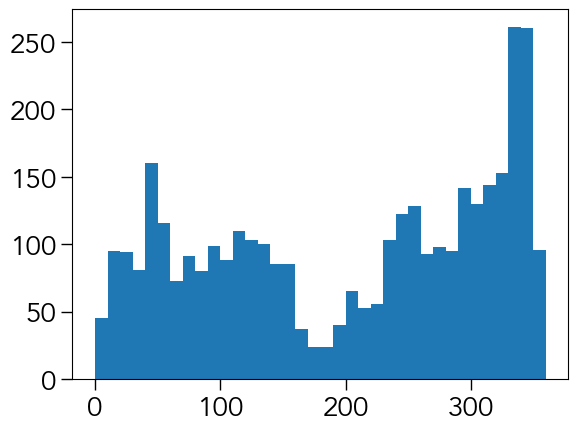

In [427]:
plt.hist(ds['WD'],bins=np.arange(0,361,10))

(array([ 47.,  46.,  49.,  74.,  59.,  66.,  95., 102.,  68.,  50.,  67.,
         99.,  94., 145., 157., 182., 176., 172., 168., 215., 252., 309.,
        372., 453., 536., 631., 672., 659., 619., 662., 589., 384., 269.,
         39.,   0.,   0.]),
 array([  0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90., 100.,
        110., 120., 130., 140., 150., 160., 170., 180., 190., 200., 210.,
        220., 230., 240., 250., 260., 270., 280., 290., 300., 310., 320.,
        330., 340., 350., 360.]),
 <BarContainer object of 36 artists>)

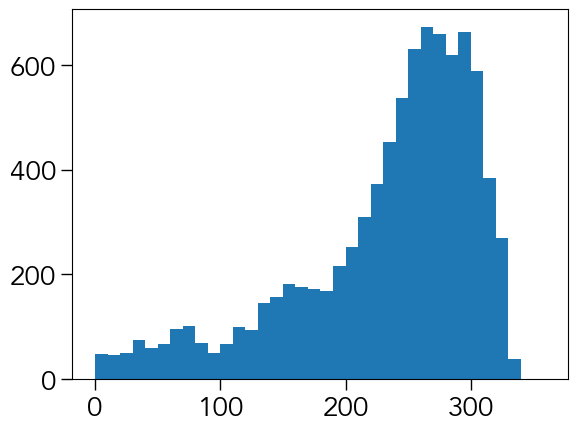

In [430]:
plt.hist(sb_pp['wind_dir'],bins=np.arange(0,361,10))

(array([ 73.,  76.,  82.,  99., 127., 106.,  65.,  88., 158., 277., 253.,
        239., 177., 182., 268., 241., 280., 212., 205., 245., 325., 405.,
        425., 440., 436., 379., 389., 376., 314., 343., 255., 295., 285.,
        152., 108.,  76.]),
 array([  0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90., 100.,
        110., 120., 130., 140., 150., 160., 170., 180., 190., 200., 210.,
        220., 230., 240., 250., 260., 270., 280., 290., 300., 310., 320.,
        330., 340., 350., 360.]),
 <BarContainer object of 36 artists>)

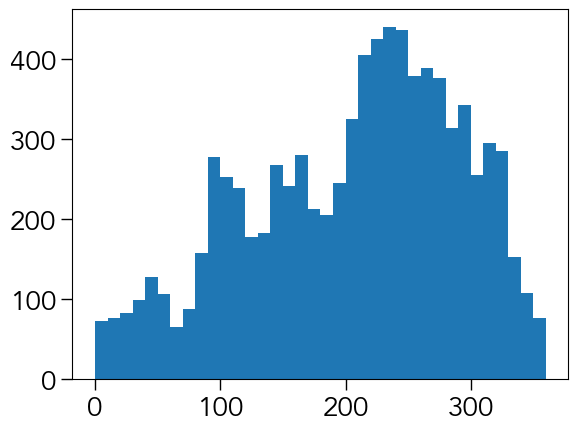

In [431]:
plt.hist(sb_k['wind_dir'],bins=np.arange(0,361,10))

## ERA5

In [1010]:
era5 = xr.open_dataset('/Users/xedhjo/Documents/Projects/QUICCHE/data/ERA5_QUICCHE.nc').mean('expver',keep_attrs=True)

era5['t2m'].values = era5['t2m'].values - 273.15
era5['sst'].values = era5['sst'].values - 273.15
era5['skt'].values = era5['skt'].values - 273.15

## Winds

### Height correction 

From [Schmidt et al. 2017](https://journals.ametsoc.org/view/journals/atot/34/12/jtech-d-17-0079.1.xml?tab_body=fulltext-display#bib36)

>With no atmospheric stability input, a logarithmic method proposed by [Peixoto and Oort (1992)](https://link.springer.com/book/9780883187128) is used. <br>
> <br>
>This is expressed as: <br>
><img src="https://latex.codecogs.com/svg.image?\huge&space;U_Z&space;=&space;U_Z_m&space;\frac{ln&space;\frac{Z}{Z_0}}{ln&space;\frac{Z_m}{Z_0}}&space;" title="https://latex.codecogs.com/svg.image?\huge U_Z = U_Z_m \frac{ln \frac{Z}{Z_0}}{ln \frac{Z_m}{Z_0}} " /> <br>
> <br>
>where $U_z$ is the wind speed at height $Z$, $Z_m$ denotes the measurement height, and $Z_0$ represents the roughness length. A typical oceanic value of **1.52 × 10$^{−4}$ m** was assumed for $Z_0$ ([Peixoto and Oort (1992)](https://link.springer.com/book/9780883187128)). This approach generates a logarithmically varying vertical wind profile while assuming neutral stability conditions. An intercomparison of https://link.springer.com/article/10.1007/s00704-012-0674-2the correction methods proposed by [Liu and Tang (1996)](https://ntrs.nasa.gov/api/citations/19970010322/downloads/19970010322.pdf) and [Peixoto and Oort (1992)](https://link.springer.com/book/9780883187128) was performed by [Mears et al. (2001)](https://doi.org/10.1029/1999JC000097), who conducted a comprehensive analysis to determine whether these laws can account for effects resulting from differences in atmospheric stability. It was concluded that the [Liu and Tang (1996)](https://ntrs.nasa.gov/api/citations/19970010322/downloads/19970010322.pdf) correction is typically on average 0.12 m s$^{−1}$ stronger than a logarithmic correction ([Mears et al. (2001)](https://doi.org/10.1029/1999JC000097); [Pickett et al. 2003](https://doi.org/10.1175/1520-0426(2003)020%3C1869:QSCWNB%3E2.0.CO;2); [Ruti et al. 2008](https://doi.org/10.1016/j.jmarsys.2007.02.026)). Under stable conditions, [Liu and Tang (1996)](https://ntrs.nasa.gov/api/citations/19970010322/downloads/19970010322.pdf) corrected winds are greater than logarithmic corrected winds, and for unstable conditions the opposite is seen (Carvalho et al. 2013). [Ruti et al. 2008](https://doi.org/10.1016/j.jmarsys.2007.02.026) also compared these correction methods and concluded that generally a difference in collocated wind speed is observed only during extreme wind events where wind speeds exceed 15 m s$^{−1}$. [Singh et al. (2013)](https://link.springer.com/article/10.1007/s00704-012-0674-2) conclude that during these extreme wind events, wind speed transformation carried out by a logarithmic profile may lead to errors of 1–1.5 m s$^{−1}$. However, it can be assumed that the use of a logarithmic extrapolation method will not cause discernable error, as there are very few instances in the WG data where the wind speed is greater than 15 m s$^{−1}$.

In [235]:
print(f"Kringla SO-CHIC: Percentage of time with winds greater than 15 m/s: {((sb_s['wind_speed'] > 15).sum() / len(sb_s['wind_speed']) * 100).values.round(3)}",fs=14)
print(f"Kringla QUICCHE: Percentage of time with winds greater than 15 m/s: {((sb_k['wind_speed'] > 15).sum() / len(sb_k['wind_speed']) * 100).values.round(3)}",fs=14)
print(f"PimPim QUICCHE: Percentage of time with winds greater than 15 m/s: {((sb_pp['FT_WindSpeed'] > 15).sum() / len(sb_pp['FT_WindSpeed']) * 100).values.round(3)}",fs=14)

<span style='font-size: 14px;'>Kringla SO-CHIC: Percentage of time with winds greater than 15 m/s: 2.855</span>

<span style='font-size: 14px;'>Kringla QUICCHE: Percentage of time with winds greater than 15 m/s: 0.024</span>

<span style='font-size: 14px;'>PimPim QUICCHE: Percentage of time with winds greater than 15 m/s: 0.114</span>

In [1011]:
def correct_wind_speed(ds, var, z):
    
    """
    Corrects wind speed measurements based on the height difference between measurement height (Z_m)
    and reference height (Z).

    Parameters:
    - ds (xarray.Dataset): Dataset containing the wind speed variable.
    - var (str): Name of the wind speed variable in the dataset.
    - z (float): Measurement height (Z_m) in meters.

    Returns:
    - corrected_wind_speed (xarray.DataArray): Wind speed corrected for the height difference.

    """

    # Extract wind speed data from the dataset
    U_Zm = ds[var].values

    # Define reference heights
    Z = 10
    Z_m = z

    # Define roughness length
    Z_0 = 1.52 * 1e-4

    # Apply the correction formula
    corrected_wind_speed = U_Zm * (np.log(Z / Z_0)) / (np.log(Z_m / Z_0))

    return corrected_wind_speed

In [1012]:
sb_k['ws10'] = ('time'), correct_wind_speed(sb_k,'wind_speed',0.5)
sb_pp['ws10'] = ('time'), correct_wind_speed(sb_pp,'wind_speed',1)
sb_pp1['ws10'] = ('time'), correct_wind_speed(sb_pp1,'wind_speed',1)
ds['ws10'] = ('time'), correct_wind_speed(ds,'TW',17)

### Subsetting SB and ERA5 data

In [1013]:
ds['hrw'] = ('time'),angle_diff(ds,'SH','TI')

In [1014]:
########## Kringla ##########
sbk_1h = sb_k.reset_coords().resample(time='1h').mean('time')
sbk_1h = sbk_1h.where(np.isfinite(sbk_1h['wind_speed']),drop=True)
sbk_1h = sbk_1h.drop('dcps_time').interpolate_na('time')
t = sbk_1h.time.values

lat_k = (np.round(sbk_1h['latitude'].interpolate_na('time') * 4) / 4)
lon_k = (np.round(sbk_1h['longitude'].interpolate_na('time') * 4) / 4)

temp = []
for i in range(len(t)):
    temp.append(era5.sel(time=t[i]).sel(longitude=lon_k[i]).sel(latitude=lat_k[i]))

era5_k = xr.concat(temp,dim='time')
era5_k['wind_speed'] = np.sqrt(era5_k['u10']**2 + era5_k['v10']**2)
era5_k['wind_dir'] = ('time'), ((np.arctan2(era5_k['u10'],era5_k['v10']) * 180 / np.pi + 180) % 360).values
era5_k['doy'] = sbk_1h['doy']
era5_k = era5_k.set_coords('doy')
sbk_1h = sbk_1h.set_coords('doy')
    
########## PimPim ##########
sbpp_1h = sb_pp.reset_coords().resample(time='1h').mean('time')
sbpp_1h = sbpp_1h.where(np.isfinite(sbpp_1h['wind_speed']),drop=True)
sbpp_1h = sbpp_1h.drop('dcps_time').interpolate_na('time')
t = sbpp_1h.time.values

lat_pp = (np.round(sbpp_1h['latitude'].interpolate_na('time') * 4) / 4)
lon_pp = (np.round(sbpp_1h['longitude'].interpolate_na('time') * 4) / 4)

   
temp = []
for i in range(len(t)):
    temp.append(era5.sel(time=t[i]).sel(longitude=lon_pp[i]).sel(latitude=lat_pp[i]))
    
era5_pp = xr.concat(temp,dim='time')
era5_pp['wind_speed'] = np.sqrt(era5_pp['u10']**2 + era5_pp['v10']**2)
era5_pp['wind_dir'] = ('time'), ((np.arctan2(era5_pp['u10'],era5_pp['v10']) * 180 / np.pi + 180) % 360).values
era5_pp['doy'] = sbpp_1h['doy']
era5_pp = era5_pp.set_coords('doy')
sbpp_1h = sbpp_1h.set_coords('doy')


########## Ship ##########
ship_1h = ds.reset_coords().resample(time='1h').mean('time')
ship_1h = ship_1h.where(np.isfinite(ship_1h['WS']),drop=True)
t = ship_1h.time.values

lat_pp = (np.round(ship_1h['LA'].interpolate_na('time') * 4) / 4)
lon_pp = (np.round(ship_1h['LO'].interpolate_na('time') * 4) / 4)

   
temp = []
for i in range(len(t)):
    temp.append(era5.sel(time=t[i]).sel(longitude=lon_pp[i]).sel(latitude=lat_pp[i]))
    
era5_ship = xr.concat(temp,dim='time')
era5_ship['wind_speed'] = np.sqrt(era5_ship['u10']**2 + era5_ship['v10']**2)
era5_ship['wind_dir'] = ('time'), ((np.arctan2(era5_ship['u10'],era5_ship['v10']) * 180 / np.pi + 180) % 360).values
era5_ship['doy'] = ship_1h['doy']
era5_ship = era5_ship.set_coords('doy')
ship_1h = ship_1h.set_coords('doy')

### Flow distortion by the ship?

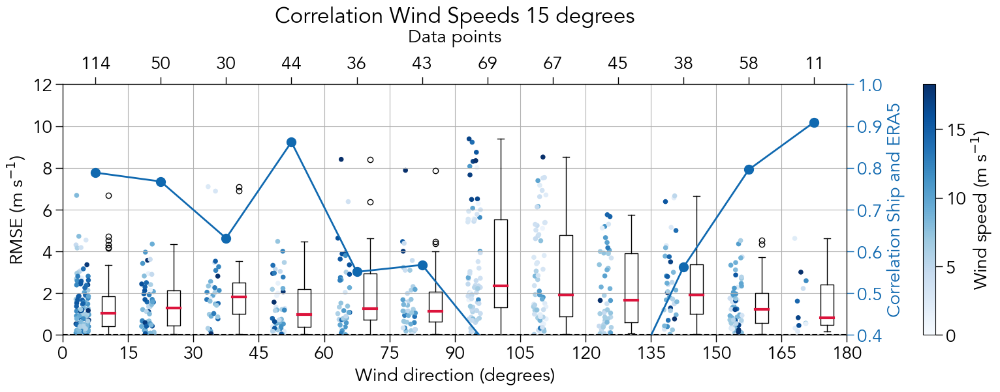

In [781]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Create the figure and axes
fig, ax = plt.subplots(figsize=(20, 5))

# Interval for binning the data
da = 15
n = []  # List to store the number of data points in each interval
R = []  # List to store the correlation coefficients

# Create additional axes
top_ax = ax.twiny()  # Top x-axis
right_ax = ax.twinx()  # Right y-axis

# Iterate over the interval of 0 to 180 (inclusive) with step size da
for i in np.arange(0, 181-da, da):
    # Create a mask to select data within the current interval
    mask = (np.abs(ship_1h['hrw']) > i) & (np.abs(ship_1h['hrw']) < i + da)
    
    # Count the number of data points in the current interval
    m = mask.sum().values
    n.append(m)
    
    # Generate random values for x-coordinate jittering of scatter plot
    rand = np.random.rand(m)
    
    # Apply the mask to select the relevant data for the boxplot
    ship_data = np.sqrt((np.square(ship_1h.where(mask, drop=True)['ws10'] - era5_ship.where(mask, drop=True)['wind_speed'])))
    
    # Calculate the correlation coefficient
    _, _, r, _, _ = stats.linregress(ship_1h.where(mask, drop=True)['ws10'], era5_ship.where(mask, drop=True)['wind_speed'])
    R.append(r ** 2)

    # Create the boxplot using the selected data and position
    position = [i + da/2 + 3]
    ax.boxplot(ship_data, positions=position, widths=3, medianprops={'color': ppc,'lw':3,'ls':'-'},zorder=2)
    
    # Create the scatter plot for ship_data with color based on wind speed
    sct = ax.scatter(position[0] + rand*3 - 7.5, ship_data, zorder=1, c=ship_1h.where(mask, drop=True)['ws10'], s=20, cmap='Blues', vmin=0)

# Customize xticks and labels for the bottom axis
xticks = np.arange(0, 181, da)
xtick_labels = [str(x) for x in xticks]

ax.set_xticks(xticks)
ax.set_xticklabels(xtick_labels)
ax.set(xlabel='Wind direction (degrees)', ylabel='RMSE (m s$^{-1}$)', ylim=(-10,20))
ax.axhline(0, ls='--', c='k', zorder=2)
ax.set(ylim=(0, 12),xlim=(0,180))

# Customize xticks and labels for the top axis
xticks = np.arange(da/2, 181, da)
xtick_labels = [str(x) for x in n]

top_ax.set_xlim(ax.get_xlim())
top_ax.set_xticks(xticks)
top_ax.set_xticklabels(xtick_labels)
top_ax.set_xlabel('Data points', labelpad=15)

# Set color and plot the correlation values
c = '#1069B0'
right_ax.plot(np.arange(da/2, 181, da), R, c=c, marker='.', ms=20, lw=2, zorder=1)
right_ax.set(ylim=(0.4, 1), title=f'Correlation Wind Speeds {da} degrees',xlim=(0,180))
right_ax.tick_params(axis='y', colors=c)
right_ax.set_ylabel('Correlation Ship and ERA5', color=c)
# right_ax.spines['right'].set_color(c)

# # Remove left spines from additional axes
# top_ax.spines['left'].set_visible(False)
# right_ax.spines['left'].set_visible(False)

# right_ax.axhline(0, ls='--', c='k')

# Add gridlines
ax.grid(zorder=1)

# Add colorbar
cbar = plt.colorbar(sct, ax=right_ax, label='Wind speed (m s$^{-1}$)',pad=0.075)


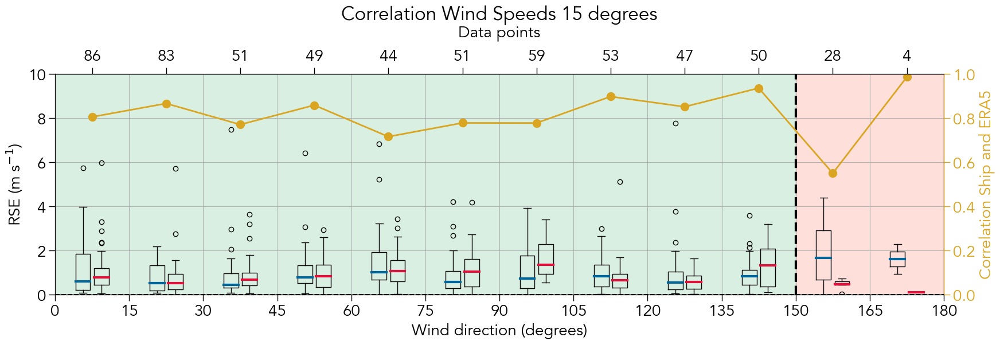

In [789]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Create the figure and axes
fig, ax = plt.subplots(figsize=(20, 5))

# Interval for binning the data
da = 15
n = []  # List to store the number of data points in each interval
n_low = []  # List to store the number of data points in each interval
n_high = []  # List to store the number of data points in each interval
R = []  # List to store the correlation coefficients

# Create additional axes
top_ax = ax.twiny()  # Top x-axis
right_ax = ax.twinx()  # Right y-axis

# Iterate over the interval of 0 to 180 (inclusive) with step size da
for i in np.arange(0, 181-da, da):
    # Create a mask to select data within the current interval
    mask  = (np.abs(ship_1h['hrw']) > i) & (np.abs(ship_1h['hrw']) < i + da)
    mask_low  = (np.abs(ship_1h['hrw']) > i) & (np.abs(ship_1h['hrw']) < i + da) & (ship_1h['ws10'] <= 8)
    mask_high = (np.abs(ship_1h['hrw']) > i) & (np.abs(ship_1h['hrw']) < i + da) & (ship_1h['ws10'] > 8)
    
    # Count the number of data points in the current interval
    m = mask.sum().values
    m_low = mask_low.sum().values
    m_high = mask_high.sum().values
    n.append(m)
    n_low.append(m_low)
    n_high.append(m_high)
    
    # Generate random values for x-coordinate jittering of scatter plot
    rand_low = np.random.rand(m_low)
    rand_high = np.random.rand(m_high)
    
    # Apply the mask to select the relevant data for the boxplot
    ship_data_low = np.sqrt((np.square(ship_1h.where(mask_low, drop=True)['ws10'] - era5_ship.where(mask_low, drop=True)['wind_speed'])))
    ship_data_high = np.sqrt((np.square(ship_1h.where(mask_high, drop=True)['ws10'] - era5_ship.where(mask_high, drop=True)['wind_speed'])))
    
    # Calculate the correlation coefficient
    _, _, r, _, _ = stats.linregress(ship_1h.where(mask, drop=True)['ws10'], era5_ship.where(mask, drop=True)['wind_speed'])
    
    R.append(r ** 2)

    # Create the boxplot using the selected data and position
    position = [i]
    ax.boxplot(ship_data_low, positions=[position[0] + 3*da/8], widths=3, medianprops={'color': kc,'lw':3,'ls':'-'},zorder=2)
    ax.boxplot(ship_data_high, positions=[position[0] + 5*da/8], widths=3, medianprops={'color': ppc,'lw':3,'ls':'-'},zorder=2)

# Customize xticks and labels for the bottom axis
xticks = np.arange(0, 181, da)
xtick_labels = [str(x) for x in xticks]

ax.set_xticks(xticks)
ax.set_xticklabels(xtick_labels)
ax.set(xlabel='Wind direction (degrees)', ylabel='RSE (m s$^{-1}$)', ylim=(0, 10), xlim=(0,180))
ax.axhline(0, ls='--', c='k', zorder=2)

# Customize xticks and labels for the top axis
xticks = np.arange(da/2, 181, da)
xtick_labels = [str(x) for x in n]

top_ax.set_xlim(ax.get_xlim())
top_ax.set_xticks(xticks)
top_ax.set_xticklabels(xtick_labels)
top_ax.set_xlabel('Data points', labelpad=15)

# Set color and plot the correlation values
c = "goldenrod"
right_ax.plot(np.arange(da/2, 181, da), R, c=c, marker='.', ms=20, lw=2, zorder=1)
right_ax.set(ylim=(0, 1), title=f'Correlation Wind Speeds {da} degrees',xlim=(0,180))
right_ax.tick_params(axis='y', colors=c)
right_ax.set_ylabel('Correlation Ship and ERA5', color=c)
right_ax.spines['right'].set_color(c)

# # Remove left spines from additional axes
# top_ax.spines['left'].set_visible(False)
# right_ax.spines['left'].set_visible(False)

# right_ax.axhline(0, ls='--', c='k')

# Add gridlines
ax.grid(zorder=1)

# Add colorbar
# cbar = plt.colorbar(sct, ax=right_ax, label='Wind speed (m s$^{-1}$)',pad=0.075)

y_limits = ax.get_ylim()
ax.fill([0, 150, 150, 0, 0], [y_limits[0], y_limits[0], y_limits[1], y_limits[1], y_limits[0]], color='mediumseagreen', alpha=0.2)
ax.fill([150, 180, 180, 150, 150], [y_limits[0], y_limits[0], y_limits[1], y_limits[1], y_limits[0]], color='tomato', alpha=0.2)
ax.axvline(150,c='k',ls='--',lw=3)

In [791]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Create the figure and axes
fig, ax = plt.subplots(figsize=(20, 5))

# Interval for binning the data
da = 15
n = []  # List to store the number of data points in each interval
n_low = []  # List to store the number of data points in each interval
n_high = []  # List to store the number of data points in each interval
R = []  # List to store the correlation coefficients

# Create additional axes
top_ax = ax.twiny()  # Top x-axis
right_ax = ax.twinx()  # Right y-axis

# Iterate over the interval of 0 to 180 (inclusive) with step size da
for i in np.arange(0, 181-da, da):
    # Create a mask to select data within the current interval
    mask  = (np.abs(ship_1h['hrw']) > i) & (np.abs(ship_1h['hrw']) < i + da)
    mask_low  = (np.abs(ship_1h['hrw']) > i) & (np.abs(ship_1h['hrw']) < i + da) & (ship_1h['ws10'] <= 8)
    mask_high = (np.abs(ship_1h['hrw']) > i) & (np.abs(ship_1h['hrw']) < i + da) & (ship_1h['ws10'] > 8)
    
    # Count the number of data points in the current interval
    m = mask.sum().values
    m_low = mask_low.sum().values
    m_high = mask_high.sum().values
    n.append(m)
    n_low.append(m_low)
    n_high.append(m_high)
    
    # Generate random values for x-coordinate jittering of scatter plot
    rand_low = np.random.rand(m_low)
    rand_high = np.random.rand(m_high)
    
    # Apply the mask to select the relevant data for the boxplot
    ship_data_low = np.sqrt((np.square(ship_1h.where(mask_low, drop=True)['ws10'] - era5_ship.where(mask_low, drop=True)['wind_speed'])))
    ship_data_high = np.sqrt((np.square(ship_1h.where(mask_high, drop=True)['ws10'] - era5_ship.where(mask_high, drop=True)['wind_speed'])))
    
    # Calculate the correlation coefficient
    _, _, r, _, _ = stats.linregress(ship_1h.where(mask, drop=True)['ws10'], era5_ship.where(mask, drop=True)['wind_speed'])
    
    R.append(r ** 2)

    # Create the boxplot using the selected data and position
    position = [i]
    ax.boxplot(ship_data_low, positions=[position[0] + 3*da/8], widths=3, medianprops={'color': kc,'lw':3,'ls':'-'},zorder=2)
    ax.boxplot(ship_data_high, positions=[position[0] + 5*da/8], widths=3, medianprops={'color': ppc,'lw':3,'ls':'-'},zorder=2)

# Customize xticks and labels for the bottom axis
xticks = np.arange(0, 181, da)
xtick_labels = [str(x) for x in xticks]

ax.set_xticks(xticks)
ax.set_xticklabels(xtick_labels)
ax.set(xlabel='Wind direction (degrees)', ylabel='RSE (m s$^{-1}$)', ylim=(0, 10), xlim=(0,180))
ax.axhline(0, ls='--', c='k', zorder=2)

# Customize xticks and labels for the top axis
xticks = np.arange(da/2, 181, da)
xtick_labels = [str(x) for x in n]

top_ax.set_xlim(ax.get_xlim())
top_ax.set_xticks(xticks)
top_ax.set_xticklabels(xtick_labels)
top_ax.set_xlabel('Data points', labelpad=15)

# Set color and plot the correlation values
c = "goldenrod"
right_ax.plot(np.arange(da/2, 181, da), R, c=c, marker='.', ms=20, lw=2, zorder=1)
right_ax.set(ylim=(0, 1), title=f'Correlation Wind Speeds {da} degrees',xlim=(0,180))
right_ax.tick_params(axis='y', colors=c)
right_ax.set_ylabel('Correlation Ship and ERA5', color=c)
right_ax.spines['right'].set_color(c)

# # Remove left spines from additional axes
# top_ax.spines['left'].set_visible(False)
# right_ax.spines['left'].set_visible(False)

# right_ax.axhline(0, ls='--', c='k')

# Add gridlines
ax.grid(zorder=1)

# Add colorbar
# cbar = plt.colorbar(sct, ax=right_ax, label='Wind speed (m s$^{-1}$)',pad=0.075)

y_limits = ax.get_ylim()
ax.fill([0, 150, 150, 0, 0], [y_limits[0], y_limits[0], y_limits[1], y_limits[1], y_limits[0]], color='mediumseagreen', alpha=0.2)
ax.fill([150, 180, 180, 150, 150], [y_limits[0], y_limits[0], y_limits[1], y_limits[1], y_limits[0]], color='tomato', alpha=0.2)
ax.axvline(150,c='k',ls='--',lw=3)

<xarray.Dataset>
Dimensions:      (time: 8846)
Coordinates:
  * time         (time) datetime64[ns] 2023-03-22T05:50:00 ... 2023-05-23T05:...
    doy          (time) float64 79.24 79.25 79.26 79.26 ... 141.2 141.2 141.2
Data variables: (12/30)
    latitude     (time) float64 ...
    longitude    (time) float64 ...
    ttff         (time) float64 ...
    count        (time) float64 ...
    commands     (time) float64 ...
    tries        (time) float64 ...
    ...           ...
    dcps_speed   (time) float64 ...
    dcps_dir     (time) float64 27.91 39.76 28.29 52.7 ... 307.6 283.3 293.0
    mday         (time) float64 0.0 0.006944 0.01389 ... 61.97 61.98 61.99
    hrw          (time) float64 83.87 29.79 63.43 45.96 ... 153.0 -178.7 -176.6
    hrc          (time) float64 -137.7 140.2 -172.2 146.0 ... 121.7 169.6 158.8
    ws10         (time) float64 10.39 12.65 12.04 11.55 ... 5.694 5.221 4.518
Attributes: (12/24)
    title:                SB PimPim Datalogger
    summary:              Datalogger output from Sailbuoy PimPim
    conventions:          CF-1.6, ACDD-1.3
    creator_name:         Johan Edholm
    platform:             Uncrewed surface vehicle
    instrument_name:      PimPim
    ...                   ...
    time_coverate_start:  2023-03-22T05:50:00.000000000
    time_coverate_end:    2023-05-23T05:30:00.000000000
    geospatial_lat_min:   -40.014976
    geospatial_lat_max:   -34.137235
    geospatial_lon_min:   14.311086
    geospatial_lon_max:   20.131414

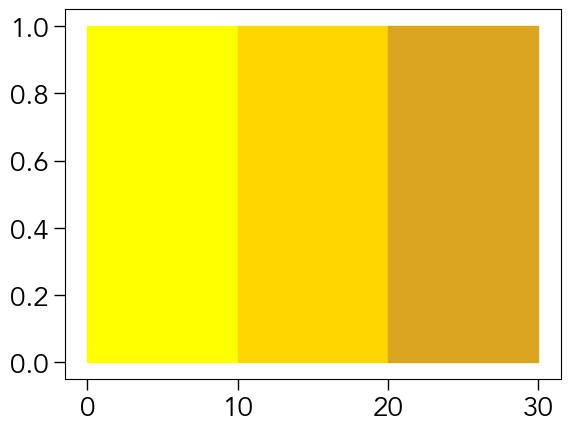

In [767]:
fig, ax = plt.subplots()
y_limits = ax.get_ylim()
ax.fill([0, 10, 10, 0, 0], [y_limits[0], y_limits[0], y_limits[1], y_limits[1], y_limits[0]], color='yellow', alpha=1)
ax.fill([10, 20, 20, 10, 10], [y_limits[0], y_limits[0], y_limits[1], y_limits[1], y_limits[0]], color='gold', alpha=1)
ax.fill([20, 30, 30, 20, 20], [y_limits[0], y_limits[0], y_limits[1], y_limits[1], y_limits[0]], color='goldenrod', alpha=1)


In [760]:
((ds['hrw'] > 150).sum() / len(ds['hrw'])) * 100

<xarray.DataArray 'hrw' ()>
array(3.85781207)

Zumorikato Kuterimotarin
Rinkashikimika Zumorikatoariarimoto

### Plotting functions

In [175]:
def calc_rmse(era5,sb,eravar,sbvar):
    return np.sqrt(np.square(era5[eravar] - sb[sbvar]).mean()).round(2).values

In [372]:
def plot_ts_sct(era5,sb,eravar,sbvar,sbc,ax,bx,bins):
    
    # Plot time series
    era5[eravar].swap_dims({'time':'doy'}).plot(x='doy',ax=ax,zorder=2,c='k',lw=2)
    sb[sbvar].swap_dims({'time':'doy'}).plot(x='doy',ax=ax,zorder=3,c=sbc,lw=2)

    # Calculate statistics
    s,i,r,p,stderr = stats.linregress(sb[sbvar],era5[eravar])
    m, b = np.polyfit(sb[sbvar], era5[eravar], 1)
    # Scatter plot and stats
    #bx.scatter(sb[sbvar],era5[eravar],alpha=1,ec=None,c=sbc)
    h=bx.hist2d(sb[sbvar],era5[eravar],bins=[bins,bins],cmin=1,cmap=cmo.amp)
    cax = inset_axes(bx, width="40%", height="5%", loc='upper left')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
    cbar = plt.colorbar(h[3], cax=cax, ax=bx,label='Count',orientation='horizontal')
    cbar.ax.xaxis.set_major_locator(MaxNLocator(integer=True, nbins=3))  # Set ticks as integers
    bx.set_title(f"y = {s.round(2)}x + {i.round(2)}",loc='right',y=0.05,x=0.975,c='k',fontsize=16)
    bxx = bx.twinx()
    bxx.set_title(r"r$^{2}$ = " + str((r**2).round(2)),loc='right',y=0.15,x=0.975,c='k',fontsize=16)
    bxx.axis('off')
    bxxx = bxx.twinx()
    bxxx.set_title(f"RMSE = {calc_rmse(era5,sb,eravar,sbvar)}",loc='right',y=0.25,x=0.975,c='k',fontsize=16)
    bxxx.axis('off')
    bxxxx = bxxx.twinx()
    bxxxx.set_title(f"n = {len(era5['time'])}",loc='right',y=0.35,x=0.975,c='k',fontsize=16)
    bxxxx.axis('off')

    # bx.plot([np.min(sb[sbvar].values),np.max(sb[sbvar].values)],
    #         [np.min(sb[sbvar].values) + i.round(3),
    #          np.max(sb[sbvar].values)*s.round(3)+i.round(3)],ls='--',c='k',lw=3)
    bx.plot(sb[sbvar].values,m*sb[sbvar].values + b,ls='-',c='k',lw=3)
    bx.plot([sb[sbvar].values.min(),sb[sbvar].values.max()],[sb[sbvar].values.min(),sb[sbvar].values.max()],ls='--',c='k',lw=3)

    
    bx.grid()
    # bx.set(xlim=(50,150),ylim=(50,150))
    bx.axis('equal')
    
    return s,i,m,b

### Plotting

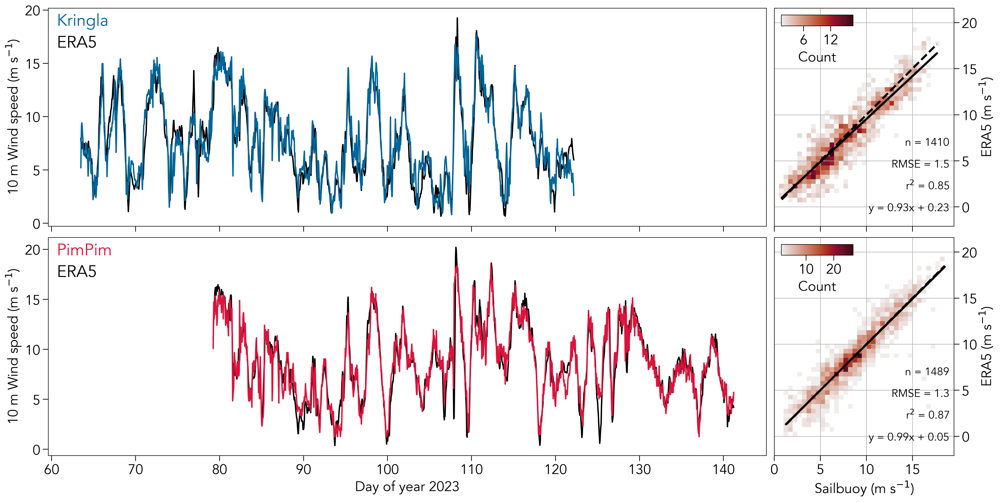

In [375]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])
cx = fig.add_subplot(spec[1, :4],sharex=ax)
dx = fig.add_subplot(spec[1, 4],sharex=bx)

eravar = 'wind_speed'
kvar = 'ws10'
ppvar = 'ws10'

s,i,m,b = plot_ts_sct(era5_k ,sbk_1h ,eravar,kvar ,kc ,ax,bx,np.arange(0,20,0.5))
s,i,m,b = plot_ts_sct(era5_pp,sbpp_1h,eravar,ppvar,ppc,cx,dx,np.arange(0,20,0.5))

for i in range(2):
    [ax,cx][i].set(xlabel=['','Day of year 2023'][i],ylabel='10 m Wind speed (m s$^{−1}$)')
    [bx,dx][i].set(xlabel=['','Sailbuoy (m s$^{−1}$)'][i],ylabel='ERA5 (m s$^{−1}$)')
    [ax,cx][i].set_title(['Kringla','PimPim'][i],loc='left',y=0.9,x=0.012,c=[kc,ppc][i])
    [ax,cx][i].set_title('ERA5',loc='right',y=0.8,x=0.012,c='k',ha='left')
    plt.setp([ax,bx][i].get_xticklabels(), visible=False)
    [bx,dx][i].yaxis.tick_right()
    [bx,dx][i].yaxis.set_label_position("right")

plt.show()

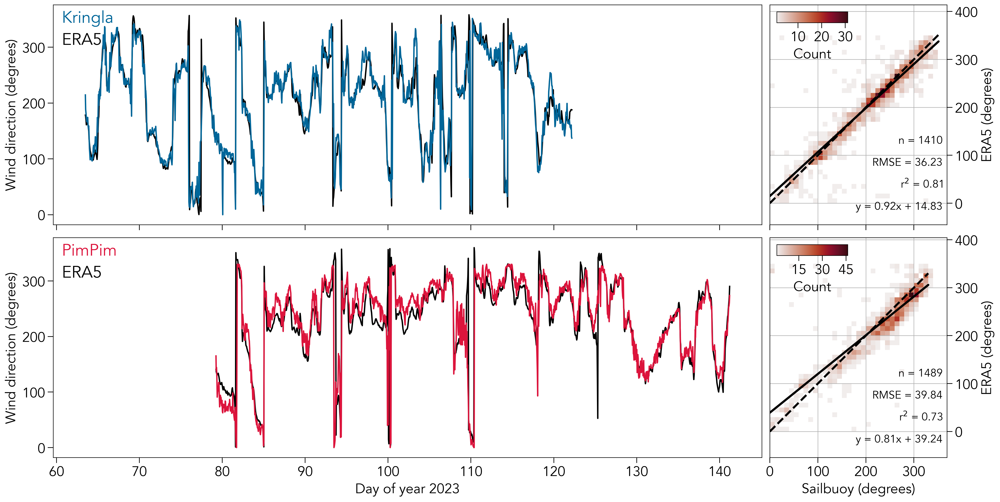

In [377]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])
cx = fig.add_subplot(spec[1, :4],sharex=ax)
dx = fig.add_subplot(spec[1, 4],sharex=bx)

eravar = 'wind_dir'
kvar = 'wind_dir'
ppvar = 'FT_WindDir'

s,i,m,b = plot_ts_sct(era5_k ,sbk_1h ,eravar,kvar ,kc ,ax,bx,np.arange(0,360,10))
s,i,m,b = plot_ts_sct(era5_pp,sbpp_1h,eravar,ppvar,ppc,cx,dx,np.arange(0,360,10))

for i in range(2):
    [ax,cx][i].set(xlabel=['','Day of year 2023'][i],ylabel='Wind direction (degrees)')
    [bx,dx][i].set(xlabel=['','Sailbuoy (degrees)'][i],ylabel='ERA5 (degrees)')
    [ax,cx][i].set_title(['Kringla','PimPim'][i],loc='left',y=0.9,x=0.012,c=[kc,ppc][i])
    [ax,cx][i].set_title('ERA5',loc='right',y=0.8,x=0.012,c='k',ha='left')
    plt.setp([ax,bx][i].get_xticklabels(), visible=False)
    [bx,dx][i].yaxis.tick_right()
    [bx,dx][i].yaxis.set_label_position("right")

plt.show()

In [317]:
_,_,r,_,_ = stats.linregress(sbk_1h['ws10'],era5_k['wind_speed'])
print(f"Full dataset:",fs=20)
print(f"r2 = {(r**2).round(2)}",fs=16)
print(f"RMSE = {calc_rmse(era5_k,sbk_1h,'wind_speed','ws10')}",fs=16)
print(f"Bias: {(sbk_1h['ws10']-era5_k['wind_speed']).mean('time').values.round(2)}",fs=16)
print(f"n = {len(sbk_1h['wind_speed'])}",fs=16)


<span style='font-size: 20px;'>Full dataset:</span>

<span style='font-size: 16px;'>r2 = 0.85</span>

<span style='font-size: 16px;'>RMSE = 1.5</span>

<span style='font-size: 16px;'>Bias: 0.31</span>

<span style='font-size: 16px;'>n = 1410</span>

In [318]:
low = np.percentile(sbk_1h['ws10'],25)
idx = np.where(sbk_1h['ws10'] < low)[0]
_,_,r,_,_ = stats.linregress(sbk_1h['ws10'][idx],era5_k['wind_speed'][idx])
print(f"Low winds (< {low.round(2)}):",fs=20)
print(f"r2 = {(r**2).round(2)}",fs=16)
print(f"RMSE = {calc_rmse(era5_k.isel(time=idx),sbk_1h.isel(time=idx),'wind_speed','ws10')}",fs=16)
print(f"Bias: {(sbk_1h.isel(time=idx)['ws10']-era5_k.isel(time=idx)['wind_speed']).mean('time').values.round(2)}",fs=16)
print(f"n = {len(idx)}",fs=16)


<span style='font-size: 20px;'>Low winds (< 4.98):</span>

<span style='font-size: 16px;'>r2 = 0.26</span>

<span style='font-size: 16px;'>RMSE = 1.41</span>

<span style='font-size: 16px;'>Bias: -0.17</span>

<span style='font-size: 16px;'>n = 353</span>

In [319]:
low = np.percentile(sbk_1h['ws10'],25)
high = np.percentile(sbk_1h['ws10'],75)
idx = np.where((sbk_1h['ws10'] < high) & (sbk_1h['ws10'] > low))[0]
_,_,r,_,_ = stats.linregress(sbk_1h['ws10'][idx],era5_k['wind_speed'][idx])
print(f"Mid winds (low < winds < high):",fs=20)
print(f"r2 = {(r**2).round(2)}",fs=16)
print(f"RMSE = {calc_rmse(era5_k.isel(time=idx),sbk_1h.isel(time=idx),'wind_speed','ws10')}",fs=16)
print(f"Bias: {(sbk_1h.isel(time=idx)['ws10']-era5_k.isel(time=idx)['wind_speed']).mean('time').values.round(2)}",fs=16)
print(f"n = {len(idx)}",fs=16)


<span style='font-size: 20px;'>Mid winds (low < winds < high):</span>

<span style='font-size: 16px;'>r2 = 0.48</span>

<span style='font-size: 16px;'>RMSE = 1.61</span>

<span style='font-size: 16px;'>Bias: 0.44</span>

<span style='font-size: 16px;'>n = 704</span>

In [320]:
low = np.percentile(sbk_1h['ws10'],25)
high = np.percentile(sbk_1h['ws10'],75)
idx = np.where((sbk_1h['ws10'] > high))[0]
_,_,r,_,_ = stats.linregress(sbk_1h['ws10'][idx],era5_k['wind_speed'][idx])
print(f"High winds (> {high.round(2)}):",fs=20)
print(f"r2 = {(r**2).round(2)}",fs=16)
print(f"RMSE = {calc_rmse(era5_k.isel(time=idx),sbk_1h.isel(time=idx),'wind_speed','ws10')}",fs=16)
print(f"Bias: {(sbk_1h.isel(time=idx)['ws10']-era5_k.isel(time=idx)['wind_speed']).mean('time').values.round(2)}",fs=16)
print(f"n = {len(idx)}",fs=16)


<span style='font-size: 20px;'>High winds (> 10.69):</span>

<span style='font-size: 16px;'>r2 = 0.61</span>

<span style='font-size: 16px;'>RMSE = 1.34</span>

<span style='font-size: 16px;'>Bias: 0.53</span>

<span style='font-size: 16px;'>n = 353</span>

In [322]:
_,_,r,_,_ = stats.linregress(sbpp_1h['ws10'],era5_pp['wind_speed'])
print(f"Full dataset:",fs=20)
print(f"r2 = {(r**2).round(2)}",fs=16)
print(f"RMSE = {calc_rmse(era5_pp,sbpp_1h,'wind_speed','ws10')}",fs=16)
print(f"Bias: {(sbpp_1h['ws10']-era5_pp['wind_speed']).mean('time').values.round(2)}",fs=16)
print(f"n = {len(sbpp_1h['ws10'])}",fs=16)

low = np.percentile(sbpp_1h['ws10'],25)
high = np.percentile(sbpp_1h['ws10'],75)

idx = np.where(sbpp_1h['ws10'] < low)[0]
_,_,r,_,_ = stats.linregress(sbpp_1h['ws10'][idx],era5_pp['wind_speed'][idx])
print(f"Low winds (< {low.round(2)}):",fs=20)
print(f"r2 = {(r**2).round(2)}",fs=16)
print(f"RMSE = {calc_rmse(era5_pp.isel(time=idx),sbpp_1h.isel(time=idx),'wind_speed','ws10')}",fs=16)
print(f"Bias: {(sbpp_1h.isel(time=idx)['ws10']-era5_pp.isel(time=idx)['wind_speed']).mean('time').values.round(2)}",fs=16)
print(f"n = {len(idx)}",fs=16)

idx = np.where((sbpp_1h['ws10'] < high) & (sbpp_1h['ws10'] > low))[0]
_,_,r,_,_ = stats.linregress(sbpp_1h['ws10'][idx],era5_pp['wind_speed'][idx])
print(f"Mid winds (low < winds < high):",fs=20)
print(f"r2 = {(r**2).round(2)}",fs=16)
print(f"RMSE = {calc_rmse(era5_pp.isel(time=idx),sbpp_1h.isel(time=idx),'wind_speed','ws10')}",fs=16)
print(f"Bias: {(sbpp_1h.isel(time=idx)['ws10']-era5_pp.isel(time=idx)['wind_speed']).mean('time').values.round(2)}",fs=16)
print(f"n = {len(idx)}",fs=16)

idx = np.where((sbpp_1h['ws10'] > high))[0]
_,_,r,_,_ = stats.linregress(sbpp_1h['ws10'][idx],era5_pp['wind_speed'][idx])
print(f"High winds (> {high.round(2)}):",fs=20)
print(f"r2 = {(r**2).round(2)}",fs=16)
print(f"RMSE = {calc_rmse(era5_pp.isel(time=idx),sbpp_1h.isel(time=idx),'wind_speed','ws10')}",fs=16)
print(f"Bias: {(sbpp_1h.isel(time=idx)['ws10']-era5_pp.isel(time=idx)['wind_speed']).mean('time').values.round(2)}",fs=16)
print(f"n = {len(idx)}",fs=16)

<span style='font-size: 20px;'>Full dataset:</span>

<span style='font-size: 16px;'>r2 = 0.87</span>

<span style='font-size: 16px;'>RMSE = 1.3</span>

<span style='font-size: 16px;'>Bias: 0.03</span>

<span style='font-size: 16px;'>n = 1489</span>

<span style='font-size: 20px;'>Low winds (< 6.1):</span>

<span style='font-size: 16px;'>r2 = 0.41</span>

<span style='font-size: 16px;'>RMSE = 1.39</span>

<span style='font-size: 16px;'>Bias: -0.03</span>

<span style='font-size: 16px;'>n = 371</span>

<span style='font-size: 20px;'>Mid winds (low < winds < high):</span>

<span style='font-size: 16px;'>r2 = 0.58</span>

<span style='font-size: 16px;'>RMSE = 1.13</span>

<span style='font-size: 16px;'>Bias: 0.09</span>

<span style='font-size: 16px;'>n = 734</span>

<span style='font-size: 20px;'>High winds (> 10.94):</span>

<span style='font-size: 16px;'>r2 = 0.48</span>

<span style='font-size: 16px;'>RMSE = 1.53</span>

<span style='font-size: 16px;'>Bias: -0.02</span>

<span style='font-size: 16px;'>n = 370</span>

## Air temp

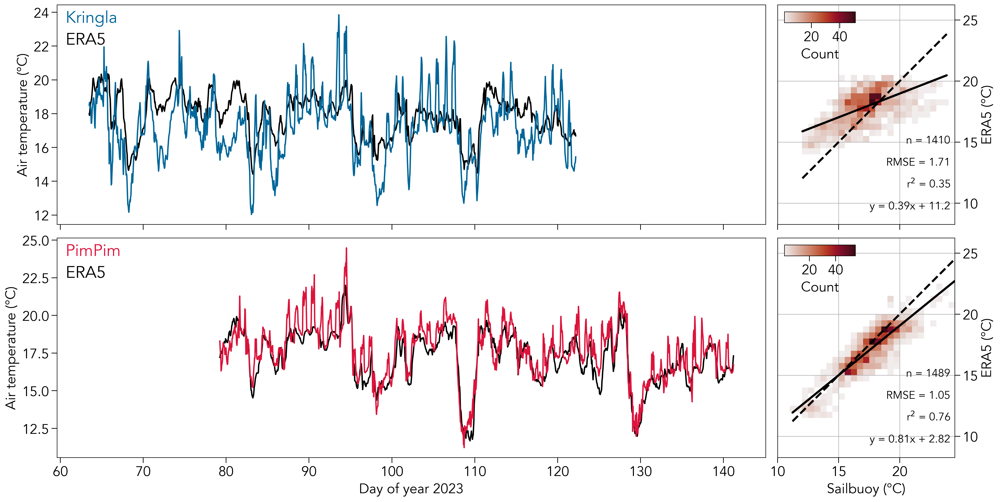

In [381]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])
cx = fig.add_subplot(spec[1, :4],sharex=ax)
dx = fig.add_subplot(spec[1, 4],sharex=bx)

eravar = 't2m'
kvar = 'air_temp'
ppvar = 'T9602_T'

plot_ts_sct(era5_k ,sbk_1h ,eravar,kvar ,kc ,ax,bx,np.arange(10,25,.5))
plot_ts_sct(era5_pp,sbpp_1h,eravar,ppvar,ppc,cx,dx,np.arange(10,25,.5))

for i in range(2):
    [ax,cx][i].set(xlabel=['','Day of year 2023'][i],ylabel='Air temperature (°C)')
    [bx,dx][i].set(xlabel=['','Sailbuoy (°C)'][i],ylabel='ERA5 (°C)')
    [ax,cx][i].set_title(['Kringla','PimPim'][i],loc='left',y=0.9,x=0.012,c=[kc,ppc][i])
    [ax,cx][i].set_title('ERA5',loc='right',y=0.8,x=0.012,c='k',ha='left')
    plt.setp([ax,bx][i].get_xticklabels(), visible=False)
    [bx,dx][i].yaxis.tick_right()
    [bx,dx][i].yaxis.set_label_position("right")

plt.show()

In [351]:
def calc_stats(sb,era,sbvar,eravar):
    _,_,r,_,_ = stats.linregress(sb[sbvar],era[eravar])
    print(f"Full dataset:",fs=20)
    print(f"r2 = {(r**2).round(2)}",fs=16)
    print(f"RMSE = {calc_rmse(era,sb,eravar,sbvar)}",fs=16)
    print(f"Bias: {(sb[sbvar]-era[eravar]).mean('time').values.round(2)}",fs=16)
    print(f"n = {len(sb[sbvar])}",fs=16)

#### Kringla

In [331]:
calc_stats(sbk_1h,era5_k,'air_temp','t2m')

<span style='font-size: 20px;'>Full dataset:</span>

<span style='font-size: 16px;'>r2 = 0.35</span>

<span style='font-size: 16px;'>RMSE = 1.71</span>

<span style='font-size: 16px;'>Bias: -0.68</span>

<span style='font-size: 16px;'>n = 1410</span>

#### PimPim

In [332]:
calc_stats(sbpp_1h,era5_pp,'T9602_T','t2m')

<span style='font-size: 20px;'>Full dataset:</span>

<span style='font-size: 16px;'>r2 = 0.76</span>

<span style='font-size: 16px;'>RMSE = 1.05</span>

<span style='font-size: 16px;'>Bias: 0.5</span>

<span style='font-size: 16px;'>n = 1489</span>

## Relative humidity

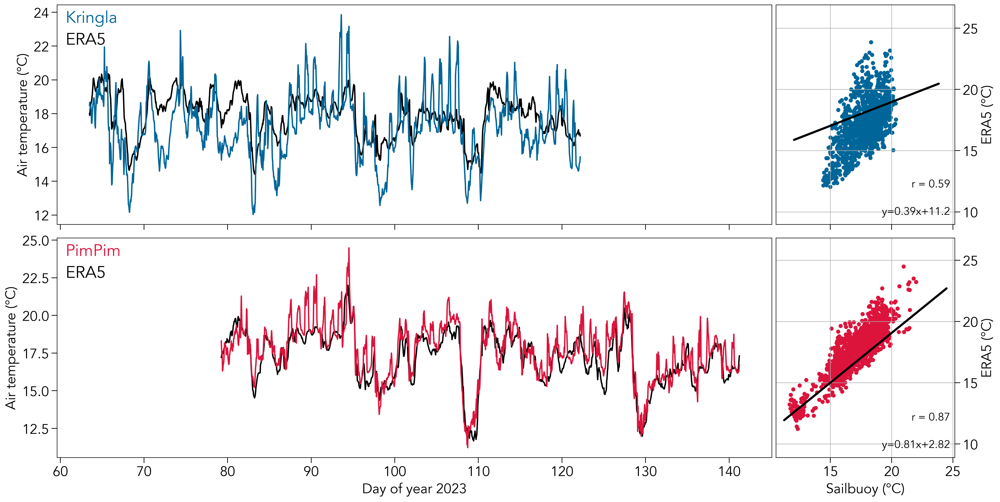

In [156]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])
cx = fig.add_subplot(spec[1, :4],sharex=ax)
dx = fig.add_subplot(spec[1, 4],sharex=bx)

eravar = 't2m'
kvar = 'air_temp'
ppvar = 'T9602_T'

plot_ts_sct(era5_k ,sbk_1h ,eravar,kvar ,kc ,ax,bx)
plot_ts_sct(era5_pp,sbpp_1h,eravar,ppvar,ppc,cx,dx)

for i in range(2):
    [ax,cx][i].set(xlabel=['','Day of year 2023'][i],ylabel='Air temperature (°C)')
    [bx,dx][i].set(xlabel=['','Sailbuoy (°C)'][i],ylabel='ERA5 (°C)')
    [ax,cx][i].set_title(['Kringla','PimPim'][i],loc='left',y=0.9,x=0.012,c=[kc,ppc][i])
    [ax,cx][i].set_title('ERA5',loc='right',y=0.8,x=0.012,c='k',ha='left')
    plt.setp([ax,bx][i].get_xticklabels(), visible=False)
    [bx,dx][i].yaxis.tick_right()
    [bx,dx][i].yaxis.set_label_position("right")

plt.show()

## Surface temperature

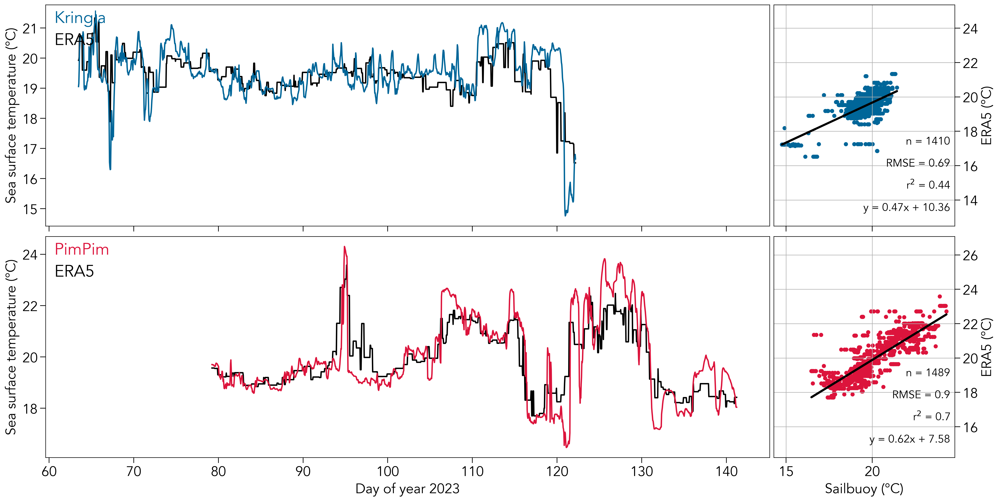

In [345]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])
cx = fig.add_subplot(spec[1, :4],sharex=ax)
dx = fig.add_subplot(spec[1, 4],sharex=bx)

eravar = 'sst'
kvar = 'sst'
ppvar = 'RBRL_T'

plot_ts_sct(era5_k ,sbk_1h ,eravar,kvar ,kc ,ax,bx)
plot_ts_sct(era5_pp,sbpp_1h,eravar,ppvar,ppc,cx,dx)

for i in range(2):
    [ax,cx][i].set(xlabel=['','Day of year 2023'][i],ylabel='Sea surface temperature (°C)')
    [bx,dx][i].set(xlabel=['','Sailbuoy (°C)'][i],ylabel='ERA5 (°C)')
    [ax,cx][i].set_title(['Kringla','PimPim'][i],loc='left',y=0.9,x=0.012,c=[kc,ppc][i])
    [ax,cx][i].set_title('ERA5',loc='right',y=0.8,x=0.012,c='k',ha='left')
    plt.setp([ax,bx][i].get_xticklabels(), visible=False)
    [bx,dx][i].yaxis.tick_right()
    [bx,dx][i].yaxis.set_label_position("right")

plt.show()

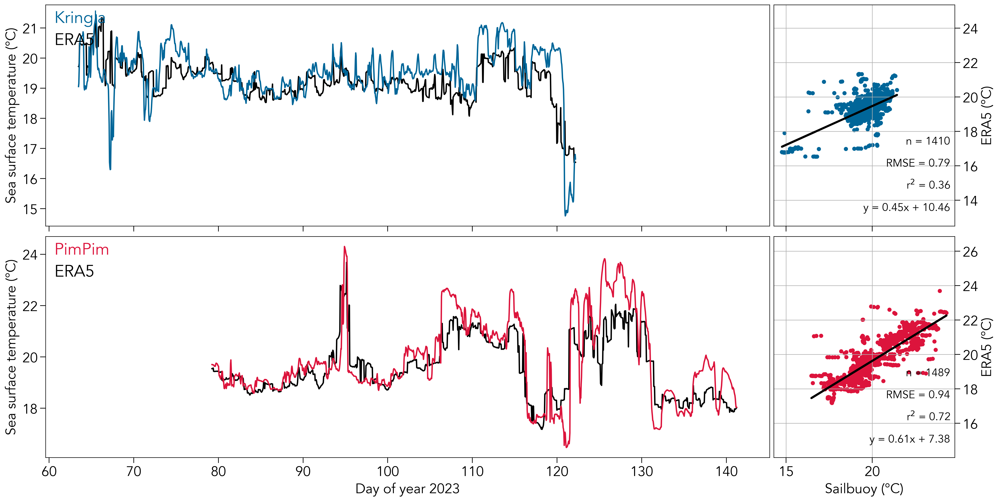

In [346]:
figprops = dict(figsize=(20, 10), dpi=300)
fig = plt.figure(layout="constrained",**figprops)
spec = fig.add_gridspec(nrows=2,ncols=5)

ax = fig.add_subplot(spec[0, :4])
bx = fig.add_subplot(spec[0, 4])
cx = fig.add_subplot(spec[1, :4],sharex=ax)
dx = fig.add_subplot(spec[1, 4],sharex=bx)

eravar = 'skt'
kvar = 'sst'
ppvar = 'RBRL_T'

plot_ts_sct(era5_k ,sbk_1h ,eravar,kvar ,kc ,ax,bx)
plot_ts_sct(era5_pp,sbpp_1h,eravar,ppvar,ppc,cx,dx)

for i in range(2):
    [ax,cx][i].set(xlabel=['','Day of year 2023'][i],ylabel='Sea surface temperature (°C)')
    [bx,dx][i].set(xlabel=['','Sailbuoy (°C)'][i],ylabel='ERA5 (°C)')
    [ax,cx][i].set_title(['Kringla','PimPim'][i],loc='left',y=0.9,x=0.012,c=[kc,ppc][i])
    [ax,cx][i].set_title('ERA5',loc='right',y=0.8,x=0.012,c='k',ha='left')
    plt.setp([ax,bx][i].get_xticklabels(), visible=False)
    [bx,dx][i].yaxis.tick_right()
    [bx,dx][i].yaxis.set_label_position("right")

plt.show()

## Testing

In [93]:
def angle_diff(ds,var1,var2):
    return np.angle(np.exp(1j * np.deg2rad(ds[var1])) / np.exp(1j * np.deg2rad(ds[var2].values)), deg=True)

In [488]:
sbpp_1h['wind_diff'] = ('time'), np.angle(np.exp(1j * np.deg2rad(era5_pp['wind_dir'])) / np.exp(1j * np.deg2rad(sbpp_1h['wind_dir'].values)), deg=True)
sbk_1h['wind_diff'] = ('time'), np.angle(np.exp(1j * np.deg2rad(era5_k['wind_dir'])) / np.exp(1j * np.deg2rad(sbk_1h['wind_dir'].values)), deg=True)

ds_k['wind_diff'] = ('time'), np.angle(np.exp(1j * np.deg2rad(ds_k['WD'])) / np.exp(1j * np.deg2rad(sb_k.sel(time=ds_k.time)['wind_dir'].values)), deg=True)
ds_k['temp_diff'] = ('time'), ds_k['AT'].values - sb_k.sel(time=ds_k.time)['air_temp'].values
ds_k['ws10_diff'] = ('time'), ds_k['ws10'].values - sb_k.sel(time=ds_k.time)['ws10'].values
ds_k['sst_diff'] = ('time'), ds_k['TT'].values - sb_k.sel(time=ds_k.time)['sst'].values
ds_k['sss_diff'] = ('time'), ds_k['SA'].values - sb_k.sel(time=ds_k.time)['sss'].values

ds_pp['wind_diff'] = ('time'), np.angle(np.exp(1j * np.deg2rad(ds_pp['WD'])) / np.exp(1j * np.deg2rad(sb_pp.sel(time=ds_pp.time)['wind_dir'].values)), deg=True)
ds_pp['temp_diff'] = ('time'), ds_pp['AT'].values - sb_pp.sel(time=ds_pp.time)['air_temp'].values
ds_pp['ws10_diff'] = ('time'), ds_pp['ws10'].values - sb_pp.sel(time=ds_pp.time)['ws10'].values
ds_pp['sst_diff'] = ('time'), ds_pp['TT'].values - sb_pp.sel(time=ds_pp.time)['sst'].values
ds_pp['sss_diff'] = ('time'), ds_pp['SA'].values - sb_pp.sel(time=ds_pp.time)['sss'].values

ds_pp1['wind_diff'] = ('time'), np.angle(np.exp(1j * np.deg2rad(ds_pp1['WD'])) / np.exp(1j * np.deg2rad(sb_pp1.sel(time=ds_pp1.time)['wind_dir'].values)), deg=True)
ds_pp1['temp_diff'] = ('time'), ds_pp1['AT'].values - sb_pp1.sel(time=ds_pp1.time)['air_temp'].values
ds_pp1['ws10_diff'] = ('time'), ds_pp1['ws10'].values - sb_pp1.sel(time=ds_pp1.time)['ws10'].values
ds_pp1['sst_diff'] = ('time'), ds_pp1['TT'].values - sb_pp1.sel(time=ds_pp1.time)['sst'].values
ds_pp1['sss_diff'] = ('time'), ds_pp1['SA'].values - sb_pp1.sel(time=ds_pp1.time)['sss'].values

In [15]:
def wind_diff_plot(ds,bin_width,ax,sbc):

    # Define wind speed intervals
    bins = np.arange(0, 17, bin_width)

    # Bin the data based on wind speed
    wind_speed_bins = np.digitize(ds['wind_speed'].values, bins)

    # Initialize lists to store statistics
    mean_diff = []
    std_diff = []

    # Compute statistics for each wind speed bin
    for bin_idx in range(1, len(bins)):
        bin_mask = (wind_speed_bins == bin_idx)
        bin_diff = ds['wind_diff'].values[bin_mask]
        mean_diff.append(np.mean(bin_diff))
        std_diff.append(np.std(bin_diff))

    # Create the line plot with error bars
    x = (bins[1:] + bins[:-1]) / 2  # Use bin centers as x-values

    # Plot histogram of difference in wind direction as a function of wind speed
    h=ax.hist2d(ds['wind_speed'],ds['wind_diff'],cmin=1,cmap=cmo.amp,bins=[np.arange(0,15,0.5),np.arange(-180,180,15)])

    # Plot the mean for each 4m/s bin and corresponding error bars
    ax.errorbar(x, mean_diff, yerr=std_diff, fmt='o-', capsize=5,c='k',mec='w',markersize=10)
    
    cax = inset_axes(ax, width="40%", height="5%", loc='upper right')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
    cbar = plt.colorbar(h[3], cax=cax, ax=ax,label='Count',orientation='horizontal')

    ax.axhline(45,lw=2,ls='--',c='k')
    ax.axhline(-45,lw=2,ls='--',c='k')
    ax.set(yticks=np.arange(-180,181,90),ylabel='Wind direction difference (degrees)',xlabel='Wind speed (m s$^{-1}$)',xticks=np.arange(0,17,4))
    ax.set_title(ds.attrs['instrument_name'],c=sbc,loc='right',y=0.02,x=0.98,fontsize='xx-large')
    ax.set_xticks(np.arange(0,17,2),minor=True)

[Text(0, 0.5, '')]

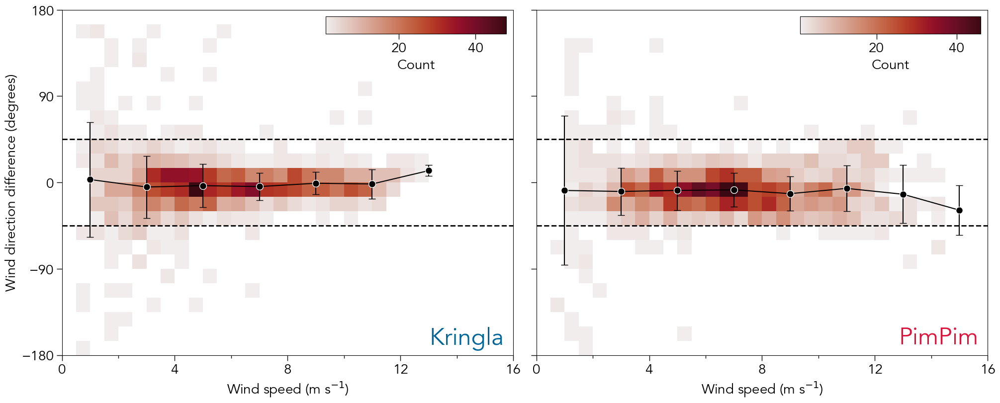

In [16]:
fig,(ax,bx) = plt.subplots(1,2,figsize=(20,8),constrained_layout=True,sharey=True)
wind_diff_plot(sbk_1h,2,ax,kc)
wind_diff_plot(sbpp_1h,2,bx,ppc)

bx.set(ylabel='')

In [447]:
def diff_hist2d(ds,bin_width,ax,sbc):

    dT = sb_1h['rh']

    for i in np.arange(0, 360, 10):

        idx = ((sb_1h['wind_dir'] > i) & (sb_1h['wind_dir'] < i + 10))

        mean = np.mean(dT[idx])
        std = np.std(dT[idx])

        ax.errorbar(i, mean, yerr=std, c='k')
        ax.scatter(i, mean, c='r', zorder=10, marker='s')
        
    # Plot histogram of difference in wind direction as a function of wind speed
    h=ax.hist2d(ds['wind_speed'],ds['wind_diff'],cmin=1,cmap=cmo.amp,bins=[np.arange(0,15,0.5),np.arange(-180,180,15)])
    
    cax = inset_axes(ax, width="40%", height="5%", loc='upper right')#, bbox_to_anchor=(0.05, 0.05, 1, 1))
    cbar = plt.colorbar(h[3], cax=cax, ax=ax,label='Count',orientation='horizontal')

    ax.axhline(45,lw=2,ls='--',c='k')
    ax.axhline(-45,lw=2,ls='--',c='k')
    ax.set(yticks=np.arange(-180,181,90),ylabel='Wind direction difference (degrees)',xlabel='Wind speed (m s$^{-1}$)',xticks=np.arange(0,17,4))
    ax.set_title(ds.attrs['instrument_name'],c=sbc,loc='right',y=0.02,x=0.98,fontsize='xx-large')
    ax.set_xticks(np.arange(0,17,2),minor=True)

(array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ...,  1., nan, nan],
        [nan, nan, nan, ...,  2., nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]),
 array([  0,  10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120,
        130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250,
        260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380,
        390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510,
        520, 530, 540, 550, 560, 570, 580, 590, 600]),
 array([-200, -190, -180, -170, -160, -150, -140, -130, -120, -110, -100,
         -90,  -80,  -70,  -60,  -50,  -40,  -30,  -20,  -10,    0,   10,
          20,   30,   40,   50,   60,   70,   80,   90,  100,  110,  120,
         130,  140,  150,  160,  170,  180,  190,  200]),
 <matplotlib.collections.QuadMesh at 0x2d522fad0>)

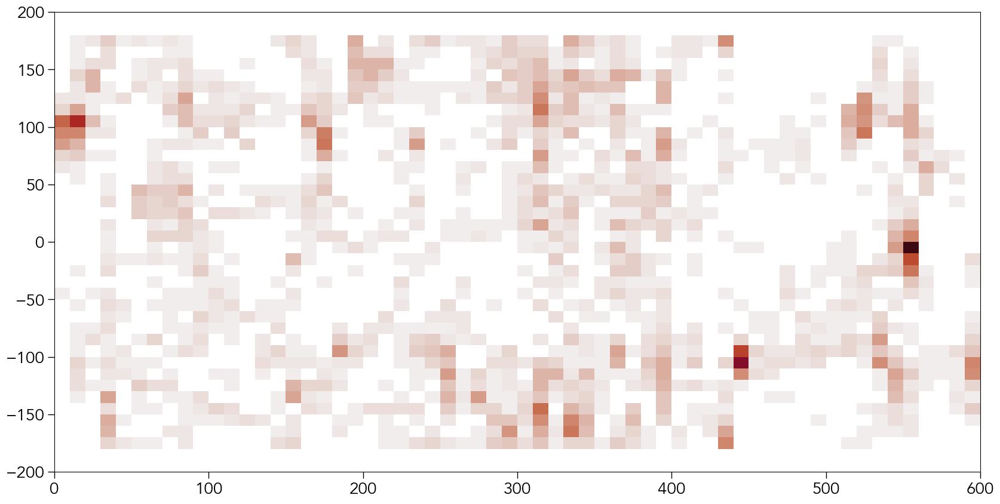

In [489]:
fig, ax = plt.subplots(figsize=(20,10))
ax.hist2d(ds_k['dts'],ds_k['wind_diff'],cmap=cmo.amp,cmin=1,bins=[np.arange(0,601,10),np.arange(-200,201,10)])

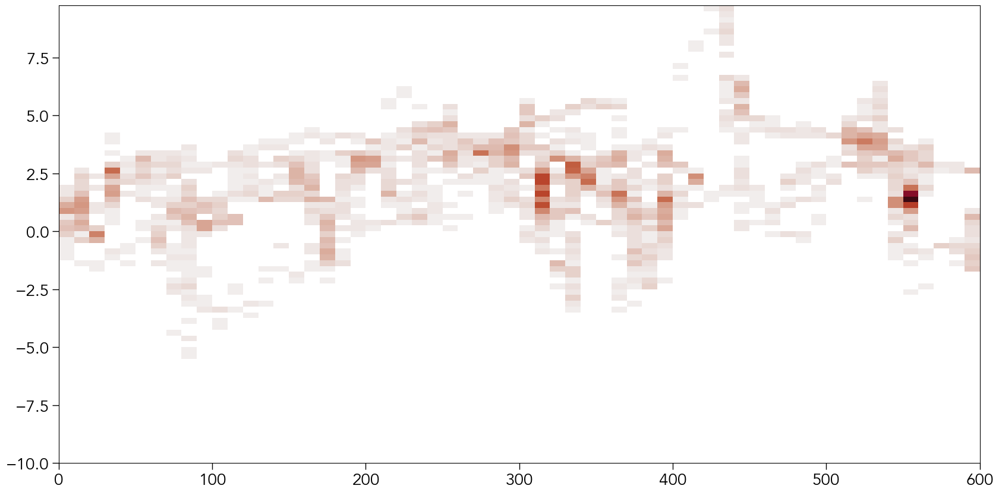

In [484]:
fig, ax = plt.subplots(figsize=(20,10))
_=ax.hist2d(ds_k['dts'],ds_k['temp_diff'],cmap=cmo.amp,cmin=1,bins=[np.arange(0,601,10),np.arange(-10,10,0.25)])

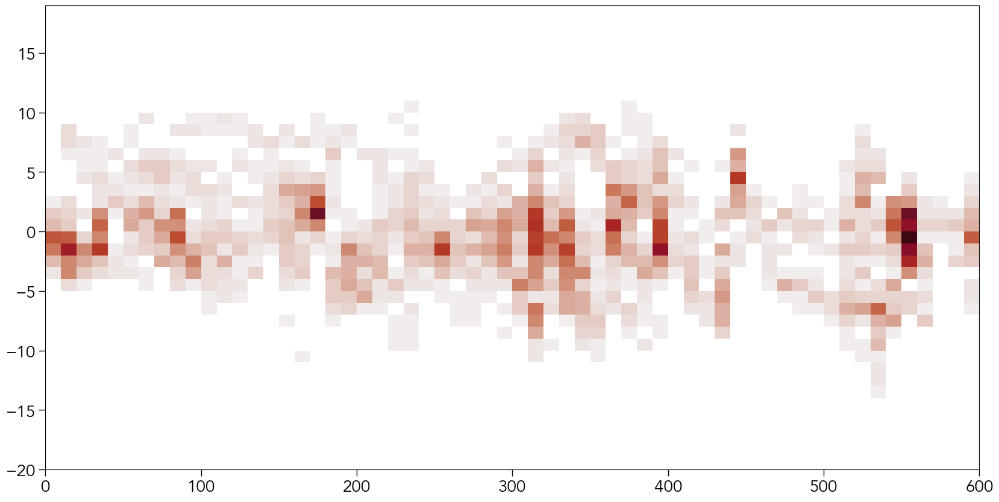

In [483]:
fig, ax = plt.subplots(figsize=(20,10))
_=ax.hist2d(ds_k['dts'],ds_k['ws10_diff'],cmap=cmo.amp,cmin=1,bins=[np.arange(0,601,10),np.arange(-20,20,1)])

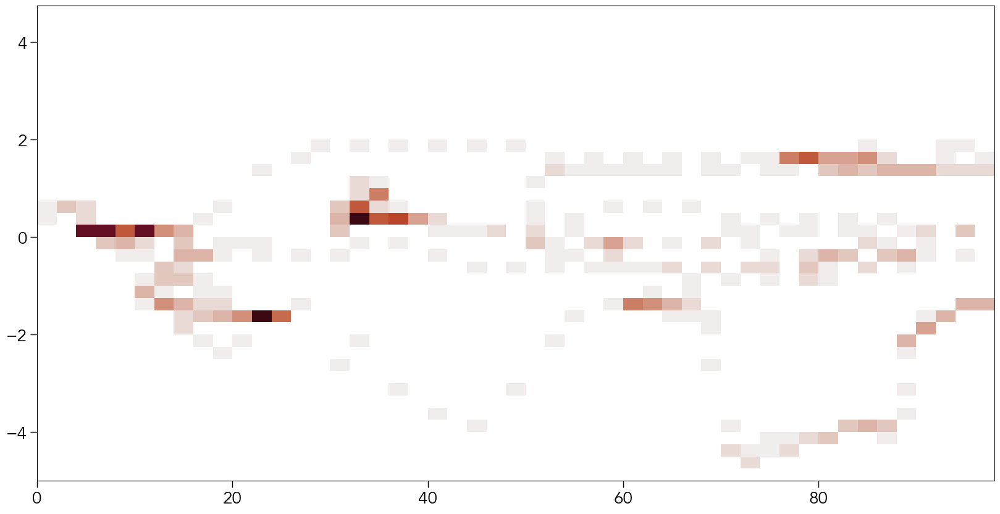

In [492]:
fig, ax = plt.subplots(figsize=(20,10))
_=ax.hist2d(ds_k['dts'],ds_k['sst_diff'],cmap=cmo.amp,cmin=1,bins=[np.arange(0,100,2),np.arange(-5,5,0.25)])

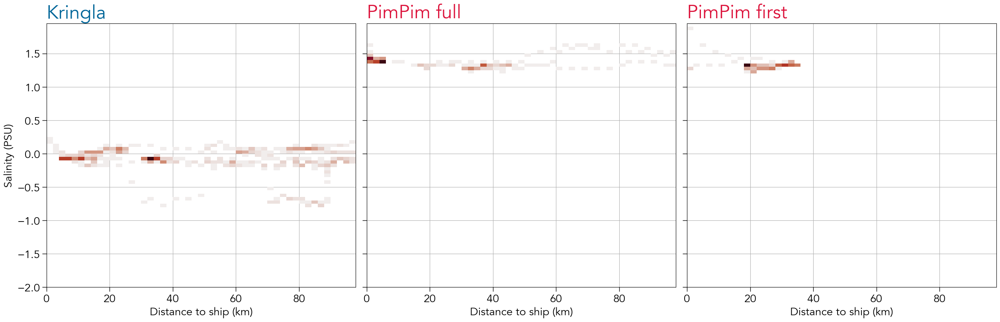

In [507]:
fig, (ax,bx,cx) = plt.subplots(1,3,figsize=(25,8),sharey=True,constrained_layout=True)
_=ax.hist2d(ds_k['dts'],ds_k['sss_diff'],cmap=cmo.amp,cmin=1,bins=[np.arange(0,100,2),np.arange(-1,1,0.05)],zorder=2)
_=bx.hist2d(ds_pp['dts'],ds_pp['sss_diff'],cmap=cmo.amp,cmin=1,bins=[np.arange(0,100,2),np.arange(-2,2,0.05)],zorder=2)
_=cx.hist2d(ds_pp1['dts'],ds_pp1['sss_diff'],cmap=cmo.amp,cmin=1,bins=[np.arange(0,100,2),np.arange(-2,2,0.05)],zorder=2)

for i,axs in enumerate([ax,bx,cx]):
    axs.grid(zorder=1)
    axs.set(xlabel='Distance to ship (km)', ylabel=['Salinity (PSU)','',''][i])
    axs.set_title(['Kringla', 'PimPim full', 'PimPim first'][i],c=[kc,ppc,ppc][i],loc='left',fontsize='xx-large')


In [508]:
import matplotlib.pyplot as plt
import numpy as np
import cmocean.cm as cmo

def plot_hist2d(dataset, variable, titles, labels):
    """
    Plots a 2D histogram for a given dataset and variable across multiple subplots.

    Parameters:
    - dataset (list of xarray.Dataset): List of datasets.
    - variable (list of str): List of variable names in the datasets.
    - titles (list of str): List of subplot titles.
    - labels (list of str): List of y-axis labels for each subplot.

    """

    # Create subplots
    fig, axs = plt.subplots(1, len(dataset), figsize=(25, 8), sharey=True, constrained_layout=True)

    # Iterate over datasets and variables
    for i, (ds, var, title, label) in enumerate(zip(dataset, variable, titles, labels)):
        axs[i].hist2d(ds['dts'], ds[var], cmap=cmo.amp, cmin=1,
                      bins=[np.arange(0, 100, 2), np.arange(-2, 2, 0.05)], zorder=2)
        
        # Customize subplot properties
        axs[i].grid(zorder=1)
        axs[i].set(xlabel='Distance to ship (km)', ylabel=label)
        axs[i].set_title(title, c=[kc, ppc, ppc][i], loc='left', fontsize='xx-large')

    # Show the plot
    plt.show()

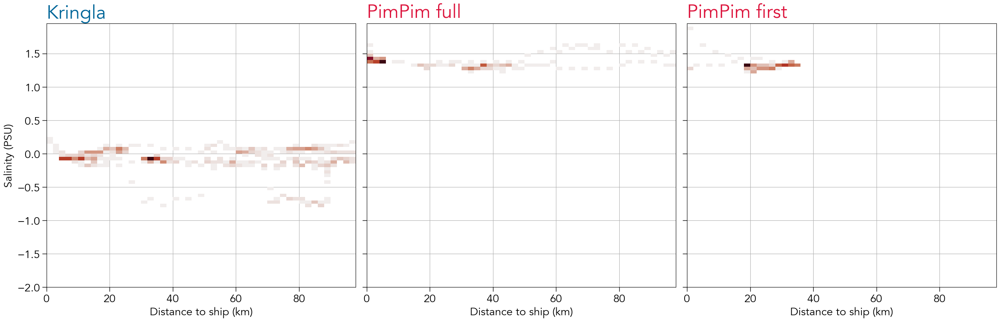

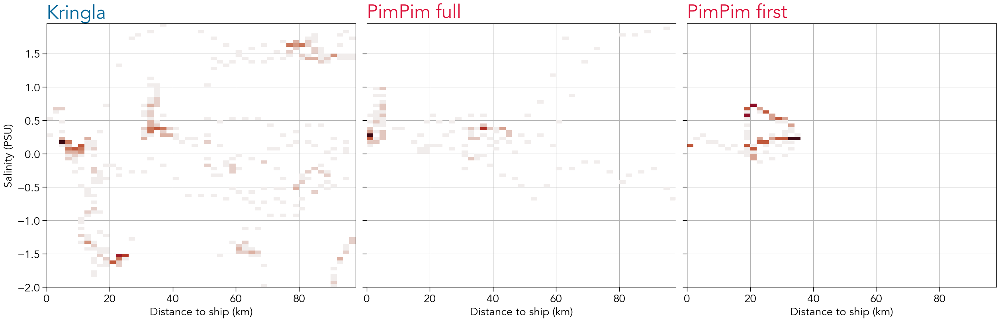

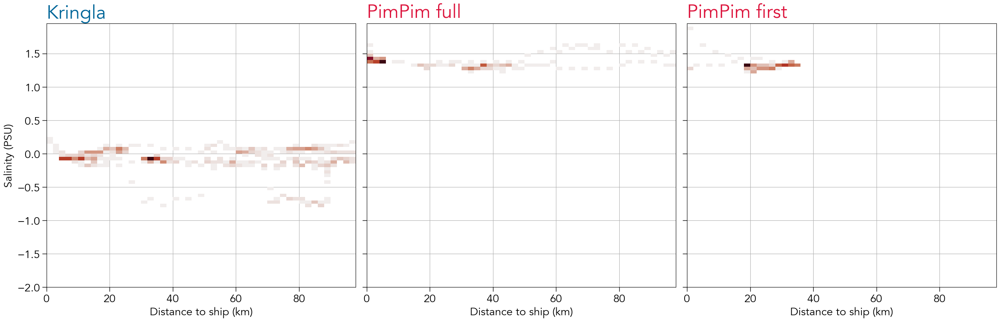

In [514]:
plot_hist2d([ds_k, ds_pp, ds_pp1],
            ['sss_diff', 'sss_diff', 'sss_diff'], 
            ['Kringla', 'PimPim full', 'PimPim first'],
            ['Salinity (PSU)', '', ''])

plot_hist2d([ds_k, ds_pp, ds_pp1],
            ['sst_diff', 'sst_diff', 'sst_diff'], 
            ['Kringla', 'PimPim full', 'PimPim first'],
            ['Salinity (PSU)', '', ''])

plot_hist2d([ds_k, ds_pp, ds_pp1],
            ['sss_diff', 'sss_diff', 'sss_diff'], 
            ['Kringla', 'PimPim full', 'PimPim first'],
            ['Salinity (PSU)', '', ''])

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
_=ax.hist2d(ds_k['dts'],ds_k['sss_diff'],cmap=cmo.amp,cmin=1,bins=[np.arange(0,100,2),np.arange(-1,1,0.05)])

In [49]:
ds_k['dts'] = dist_k

In [515]:
def error_bars_dist(ax,ship,sb,var1,var2,dd):
    
    dv = ship[var1] - sb.sel(time=ship.time)[var2].values
    
    for i in np.arange(0, 600, dd):

        idx = ((ship['dts'].values > i) & (ship['dts'].values < i + dd))

        mean = np.mean(dv[idx])
        std = np.std(dv[idx])

        ax.errorbar(i, mean, yerr=std, c='k')
        ax.scatter(i, mean, c='red', zorder=10, marker='s')

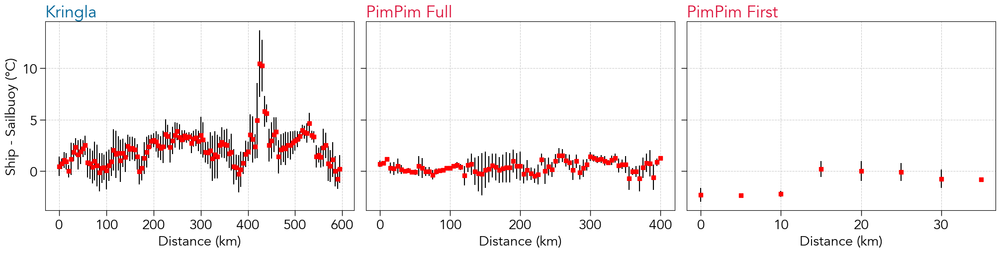

In [446]:
fig, ax = plt.subplots(1,3,figsize=(20,5),constrained_layout=True,sharey=True)

sbs = [sb_k, 
       sb_pp, 
       sb_pp1]

ship = [ds_k, 
       ds_pp,
       ds_pp1]

var = ['air_temp', 
       'air_t', 
       'air_t']

cs =  [kc,
       ppc,
       ppc]

names = ['Kringla', 
         'PimPim Full', 
         'PimPim First']

for i,axs in enumerate(ax):
    
    error_bars_dist(axs, ship[i],  sbs[i],  'AT', var[i], 5)
    axs.set(xlabel='Distance (km)', ylabel=['Ship - Sailbuoy (°C)','',''][i])
    axs.grid(ls='--', c='0.8')
    axs.set_title(names[i],loc='left',c=cs[i])


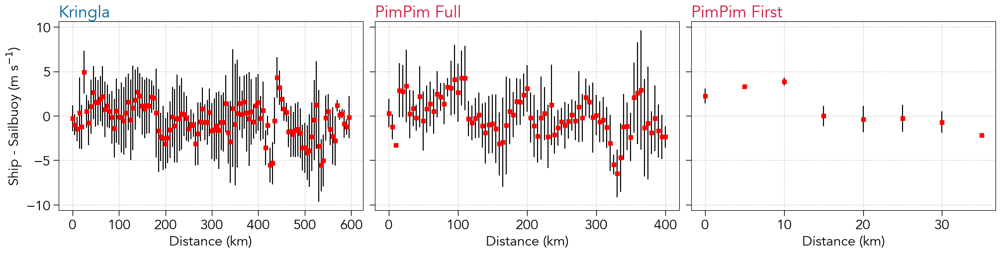

In [445]:
fig, ax = plt.subplots(1,3,figsize=(20,5),constrained_layout=True,sharey=True)

sbs = [sb_k, 
       sb_pp, 
       sb_pp1]

ship = [ds_k, 
       ds_pp,
       ds_pp1]

var = ['ws10', 
       'ws10', 
       'ws10']

cs =  [kc,
       ppc,
       ppc]

names = ['Kringla', 
         'PimPim Full', 
         'PimPim First']

for i,axs in enumerate(ax):
    
    error_bars_dist(axs, ship[i],  sbs[i],  'ws10', var[i], 5)
    axs.set(xlabel='Distance (km)', ylabel=['Ship - Sailbuoy (m s$^{-1}$)','',''][i])
    axs.grid(ls='--', c='0.8')
    axs.set_title(names[i],loc='left',c=cs[i])


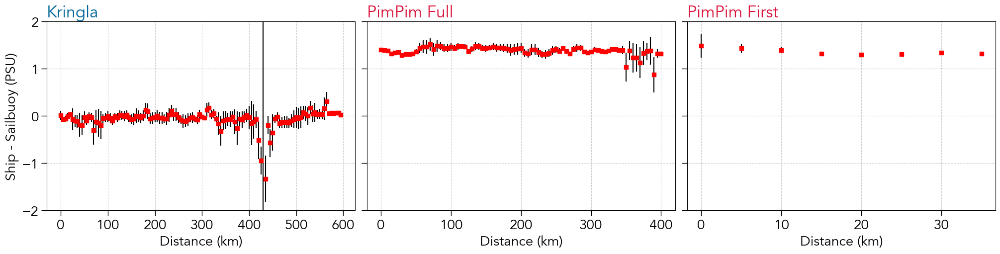

In [517]:
fig, ax = plt.subplots(1,3,figsize=(20,5),constrained_layout=True,sharey=True)

sbs = [sb_k, 
       sb_pp, 
       sb_pp1]

ship = [ds_k, 
       ds_pp,
       ds_pp1]

var = ['sss', 
       'sss', 
       'sss']

cs =  [kc,
       ppc,
       ppc]

names = ['Kringla', 
         'PimPim Full', 
         'PimPim First']

for i,axs in enumerate(ax):
    
    error_bars_dist(axs, ship[i],  sbs[i],  'SA', var[i], 5)
    axs.set(xlabel='Distance (km)', ylabel=['Ship - Sailbuoy (PSU)','',''][i],ylim=(-2,2))
    axs.grid(ls='--', c='0.8')
    axs.set_title(names[i],loc='left',c=cs[i])


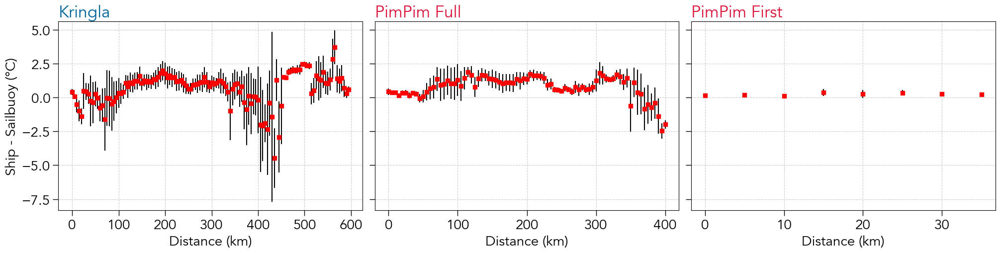

In [518]:
fig, ax = plt.subplots(1,3,figsize=(20,5),constrained_layout=True,sharey=True)

sbs = [sb_k, 
       sb_pp, 
       sb_pp1]

ship = [ds_k, 
       ds_pp,
       ds_pp1]

var = ['sst', 
       'sst', 
       'sst']

cs =  [kc,
       ppc,
       ppc]

names = ['Kringla', 
         'PimPim Full', 
         'PimPim First']

for i,axs in enumerate(ax):
    
    error_bars_dist(axs, ship[i],  sbs[i],  'TT', var[i], 5)
    axs.set(xlabel='Distance (km)', ylabel=['Ship - Sailbuoy (°C)','',''][i])
    axs.grid(ls='--', c='0.8')
    axs.set_title(names[i],loc='left',c=cs[i])


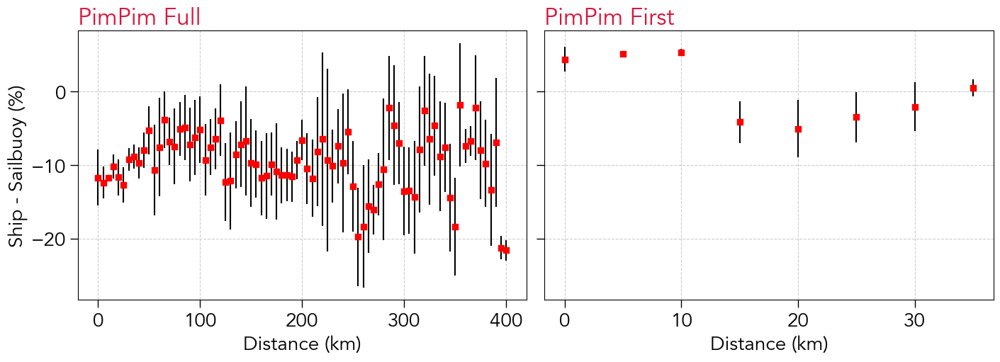

In [98]:
fig, ax = plt.subplots(1,2,figsize=(14,5),constrained_layout=True,sharey=True)

sbs = [sb_pp, 
       sb_pp1]

ship = [ds_pp,
       ds_pp1]

var = ['rh', 
       'rh']

cs =  [ppc,
       ppc]

names = ['PimPim Full', 
         'PimPim First']

for i,axs in enumerate(ax):
    
    error_bars_dist(axs, ship[i],  sbs[i],  'RH', var[i], 5)
    axs.set(xlabel='Distance (km)', ylabel=['Ship - Sailbuoy (%)','',''][i])
    axs.grid(ls='--', c='0.8')
    axs.set_title(names[i],loc='left',c=cs[i])


In [117]:
# def stacked_dist(ax,ship,sb,var1,var2,dd):

dv = ds_pp['RH'] - sb_pp.sel(time=ds_pp.time)['rh'].values

tmp = []
dd = 10

for i in np.arange(0, ds_pp['dts'].values.max(), dd):

    idx = ((ds_pp['dts'].values > i) & (ds_pp['dts'].values < i + dd))
    tmp.append(dv[idx].values)
    

/var/folders/kv/12hx37w96j39x9h5z7hw8hy40000gn/T/ipykernel_10704/286963570.py:35: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 2000x2000 with 0 Axes>

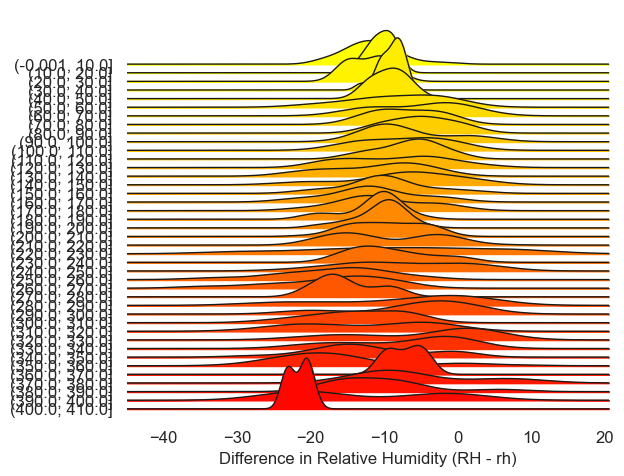

In [194]:
import joypy
import pandas as pd
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(20,20))
# Convert xarray datasets to pandas dataframes
df_ds_pp = ds_pp[['RH', 'dts']].to_dataframe()
df_sb_pp = sb_pp['rh'].sel(time=ds_pp.time).to_dataframe()

# Create a new dataframe combining the relevant variables from both datasets
data = pd.concat([df_ds_pp, df_sb_pp], axis=1)

# Calculate the difference between RH and rh
data['RH_diff'] = data['RH'] - data['rh']

# Define the distance bins
bins = list(range(0, int(data['dts'].max()) + 11, 10))  # Every 5 km

# Create a new column for distance bin categories based on 'dts'
data['dts_bin'] = pd.cut(data['dts'], bins=bins, include_lowest=True)

# Create subplots for each distance bin with overlapping densities based on 'RH_diff'
fig, axes = joypy.joyplot(data, 
                          column='RH_diff', 
                          by='dts_bin',
                          kind="kde", 
                          overlap=.75, 
                          linewidth=1, 
                          colormap=cm.autumn_r)

# Set labels and titles for the subplots
plt.xlabel('Difference in Relative Humidity (RH - rh)')
plt.ylabel('Distance Bin')

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


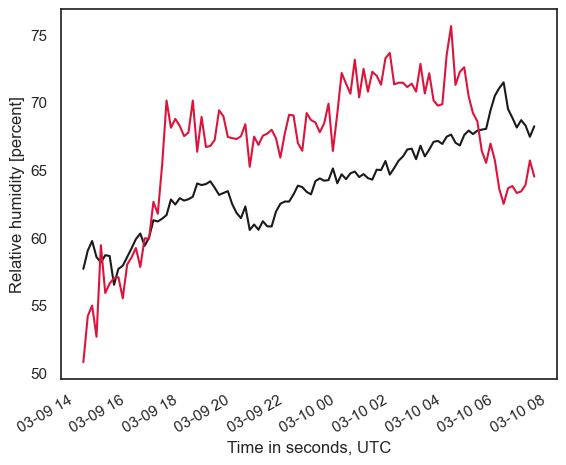

In [195]:
ds_pp1['RH'].plot(c='k')
sb_pp1['rh'].sel(time=ds_pp1.time).plot(c=ppc)

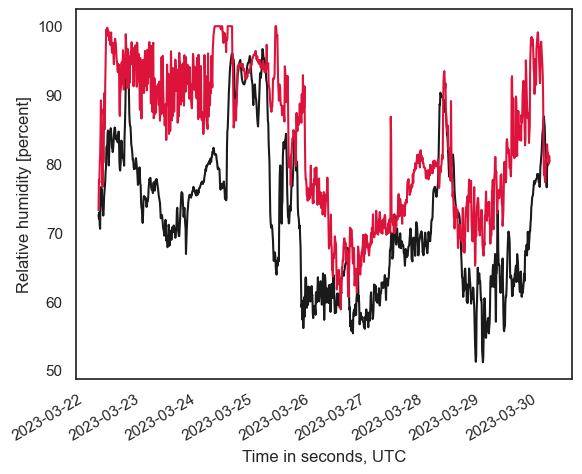

In [196]:
ds_pp['RH'].plot(c='k')
sb_pp['rh'].sel(time=ds_pp.time).plot(c=ppc)

In [201]:
from astral import LocationInfo
import datetime
from astral.sun import sun

l = LocationInfo()
l.name = 'Ship'
l.region = 'region'
l.timezone = 'UTC'
l.latitude = -36
l.longitude = 16


s = sun(l.observer, date=datetime.date(2023, 3, 12))

print((
    f'Dawn:    {s["dawn"]}\n'
    f'Sunrise: {s["sunrise"]}\n'
    f'Noon:    {s["noon"]}\n'
    f'Sunset:  {s["sunset"]}\n'
    f'Dusk:    {s["dusk"]}\n'
))

<span style='font-size: 20px;'>Dawn:    2023-03-12 04:25:43.783304+00:00
Sunrise: 2023-03-12 04:51:58.137217+00:00
Noon:    2023-03-12 11:05:55+00:00
Sunset:  2023-03-12 17:19:01.443909+00:00
Dusk:    2023-03-12 17:45:12.409086+00:00
</span>

In [253]:
sunrise = [] 
sunset  = []

days = list(sb_pp.groupby('time.dayofyear').groups.keys())
lats = sb_pp.groupby('time.dayofyear').mean('time').latitude
lons = sb_pp.groupby('time.dayofyear').mean('time').longitude

for i,day in enumerate(tqdm(days)):
    
    l = LocationInfo()
    l.name = 'Sailbuoy'
    l.region = 'region'
    l.timezone = 'UTC'
    l.latitude = lats[i]
    l.longitude = lons[i]

    s = sun(l.observer, date=mdates.num2date(mdates.date2num(np.datetime64('2023-01-01') + np.timedelta64(days[i] - 1,'D'))))

    sunrise.append(np.datetime64(s["sunrise"],'s'))    
    sunset.append(np.datetime64(s["sunset"],'s'))    

sunrise = np.array(sunrise)
sunset  = np.array(sunset)

  0%|          | 0/63 [00:00<?, ?it/s]

/var/folders/kv/12hx37w96j39x9h5z7hw8hy40000gn/T/ipykernel_10704/262593295.py:19: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
  sunrise.append(np.datetime64(s["sunrise"],'s'))
/var/folders/kv/12hx37w96j39x9h5z7hw8hy40000gn/T/ipykernel_10704/262593295.py:20: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
  sunset.append(np.datetime64(s["sunset"],'s'))


In [267]:
nidx = []
didx = []

for i,day in enumerate(days):

    didx.append(np.where((sb_pp.time > sunrise[i]) & (sb_pp.time < sunset[i]))[0])
    if i+1 < len(days):
        nidx.append(np.where((sb_pp.time < sunrise[i + 1]) & (sb_pp.time > sunset[i]))[0])

nidx = np.concatenate(nidx)
didx = np.concatenate(didx)

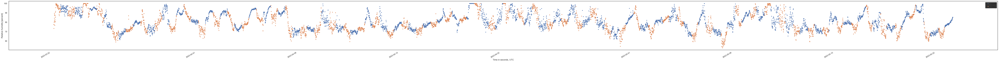

In [276]:
sb_pp.isel(time=nidx)['rh'].plot(marker='.',ls='',figsize=(100,5),label='Night')
sb_pp.isel(time=didx)['rh'].plot(marker='.',ls='',c='C1',label='Day')
plt.legend()

In [ ]:
sb_pp.isel(time=nidx)['rh'].plot(marker='.',ls='',figsize=(100,5),label='Night')
sb_pp.isel(time=didx)['rh'].plot(marker='.',ls='',c='C1',label='Day')
plt.legend()

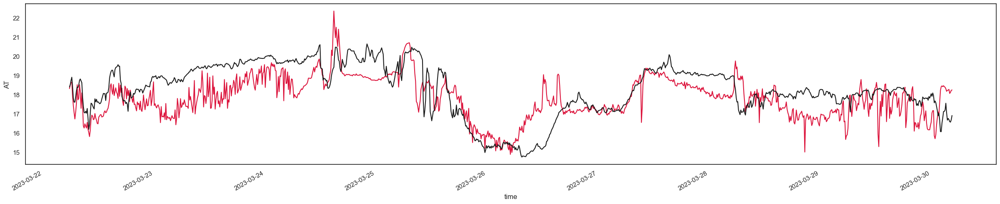

In [212]:
fig, ax  = plt.subplots(figsize=(30,5))
sb_pp.sel(time=ds_pp.time)['air_t'].plot(c=ppc)
ds_pp['AT'].plot(c='k')


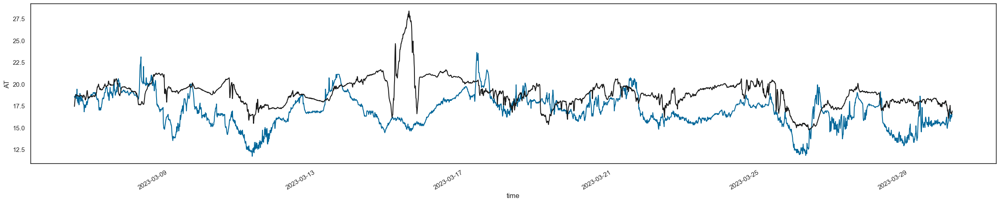

In [214]:
fig, ax  = plt.subplots(figsize=(30,5))
sb_k.sel(time=ds_k.time)['air_temp'].plot(c=kc)
ds_k['AT'].plot(c='k')


In [523]:
sbk_1h

<xarray.Dataset>
Dimensions:         (time: 1410)
Coordinates:
  * time            (time) datetime64[ns] 2023-03-06T11:00:00 ... 2023-05-04T...
    doy             (time) float64 63.48 63.52 63.56 63.6 ... 122.1 122.1 122.2
Data variables: (12/29)
    latitude        (time) float64 -37.16 -37.15 -37.13 ... -33.35 -33.34 -33.33
    longitude       (time) float64 16.07 16.1 16.13 16.16 ... 17.8 17.8 17.8
    ttff            (time) float64 11.5 11.17 11.67 11.67 ... 11.17 11.0 11.2
    count           (time) float64 12.5 17.5 23.5 29.5 ... 46.5 52.5 38.5 4.0
    commands        (time) float64 0.0 0.1667 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    tries           (time) float64 1.0 1.167 1.0 1.5 ... 1.0 1.167 1.167 1.0
    ...              ...
    sss             (time) float64 35.32 35.45 35.47 35.45 ... 35.07 35.06 35.06
    mday            (time) float64 0.01042 0.04514 0.08681 ... 58.63 58.67 58.71
    hrw             (time) float64 -135.0 92.98 89.33 ... -113.8 -139.1 -130.0
    hrc             (time) float64 0.5942 -121.2 -72.22 ... 12.35 -14.12 -7.951
    ws10            (time) float64 5.21 7.253 9.163 9.416 ... 3.875 3.544 2.614
    wind_diff       (time) float64 -36.14 -12.81 -12.32 ... 27.51 48.67 50.68
Attributes: (12/24)
    title:                SB Kringla Datalogger
    summary:              Datalogger output from Sailbuoy Kringla
    conventions:          CF-1.6, ACDD-1.3
    creator_name:         Johan Edholm
    platform:             Uncrewed surface vehicle
    instrument_name:      Kringla
    ...                   ...
    time_coverate_start:  2023-02-21T13:43:11.000000000
    time_coverate_end:    2023-05-04T11:50:00.000000000
    geospatial_lat_min:   -37.933327
    geospatial_lat_max:   -33.321951
    geospatial_lon_min:   16.049747
    geospatial_lon_max:   19.96224

In [525]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Load the position dataset (sbk_1h)
data_position = sbk_1h

# Load the field dataset (era5_k)
data_field = era5

# Extract latitude, longitude, and time from the position dataset
lat_position = data_position['latitude'].values
lon_position = data_position['longitude'].values
time_position = data_position['time'].values

# Extract the variable of interest from the field dataset
variable_field = data_field['t2m'].values

correlation_map = np.zeros((len(lat_position), len(lon_position)))  # Initialize the correlation map

for i, lat in enumerate(lat_position):
    for j, lon in enumerate(lon_position):
        # Extract the variable at the current position
        variable_position = variable_field[:, i, j]

        # Calculate the correlation coefficient between the position variable and the field variable
        correlation = np.corrcoef(variable_position, variable_field)[0, 1]

        # Store the correlation coefficient in the correlation map
        correlation_map[i, j] = correlation

# Create a meshgrid for the x and y distances
x, y = np.meshgrid(lon_position, lat_position)

# Create the plot
plt.pcolormesh(x, y, correlation_map, cmap='jet')
plt.colorbar(label='Correlation Coefficient')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Correlation Map')
plt.show()


IndexError: too many indices for array: array is 1-dimensional, but 3 were indexed

In [616]:
lat  = (sbk_1h['latitude'].values*4).round(0)/4
lon  = (sbk_1h['longitude'].values*4).round(0)/4
time = sbk_1h['time'].values
lat_grid = era5['latitude'].values
lon_grid = era5['longitude'].values



In [ ]:
""""
In this code, the grid variable represents a 2D array that will store the calculated distances. 
The code iterates over the lat_grid and lon_grid arrays, and for each combination of latitude and longitude, it calculates the distance between the coordinates specified by lon[150] and x, and lat[150] and y. 
The calculated distance is then stored in the corresponding position in the grid array.

Please note that you may need to adjust the code based on the availability and dimensions of the lat_grid, lon_grid, lon, and lat variables in your actual implementation. 
Additionally, ensure that you have the necessary dependencies installed, such as the gsw package for the gsw.distance function.
""""

# Create an empty grid
grid = np.zeros((len(lat_grid), len(lon_grid)))

# Iterate over the lat_grid and lon_grid arrays
for i, y in enumerate(lat_grid):
    for j, x in enumerate(lon_grid):
        # Calculate the distance between two coordinates using gsw.distance
        distance = gsw.distance([lon[150], x], [lat[150], y]) / 1000
        
        # Store the distance in the grid array
        grid[i, j] = distance


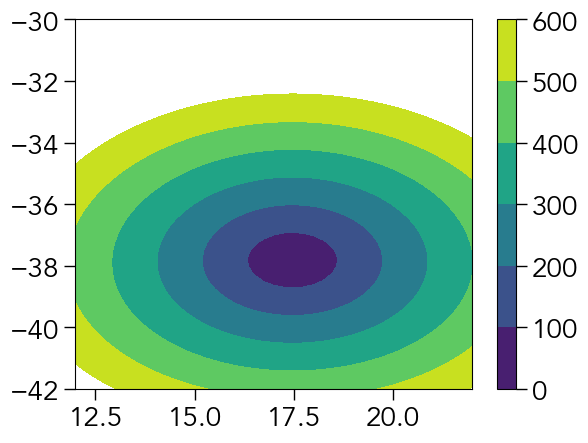

In [605]:
cnt = plt.contourf(lon_grid,lat_grid,grid,levels=np.arange(0,601,100))
plt.colorbar(cnt)

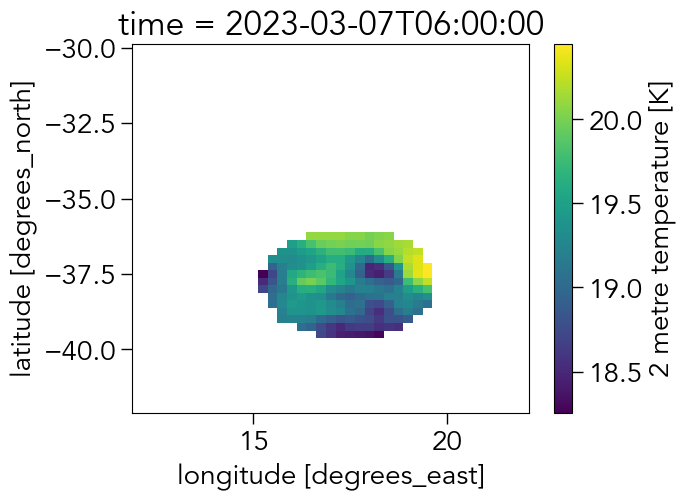

In [607]:
era5.isel(time=150).where(grid < 200)['t2m'].plot()

##### 

In [641]:
""""
In this code, the variable dl represents the value used to define a range around specific coordinates. 
The code creates an empty array called era5temp to store the ERA5 temperature data.
It then iterates over the time values in sbk_1h and retrieves the corresponding ERA5 data for each time, within the specified longitude and latitude range. 
The retrieved data is stored in the era5temp array.

Please note that you may need to adjust the code based on the availability and dimensions of the sbk_1h and era5 datasets in your actual implementation.
""""

# Define the value of dl
dl = 1

# Create an empty array to store the ERA5 temperature data
era5temp = np.zeros((2 * dl * 4 + 1, 2 * dl * 4 + 1, len(sbk_1h.time)))

# Iterate over the time values in sbk_1h
for i in range(len(sbk_1h.time.values)):
    # Retrieve the ERA5 data for the corresponding time, longitude, and latitude
    era5_data = era5.sel(time=sbk_1h.time[i].values)
    era5_data = era5_data.sel(longitude=slice(lon[i] - dl, lon[i] + dl))
    era5_data = era5_data.sel(latitude=slice(lat[i] + dl, lat[i] - dl))['t2m'].values
    
    # Store the ERA5 data in the era5temp array
    era5temp[:, :, i] = era5_data

In [646]:
temp_corr = np.zeros((2 * dl * 4 + 1, 2 * dl * 4 + 1))

In [648]:
from scipy.stats import pearsonr


In [650]:
r,_ = pearsonr(era5temp[0,0],sbk_1h['air_temp'])

In [651]:
r

0.4291186781908541

In [658]:

temp_corr = np.zeros((2 * dl * 4 + 1, 2 * dl * 4 + 1))

for i in range(temp_corr.shape[0]):
    for j in range(temp_corr.shape[1]):
        temp_corr[i,j],_ = pearsonr(era5temp[i,j],sbk_1h['air_temp'])

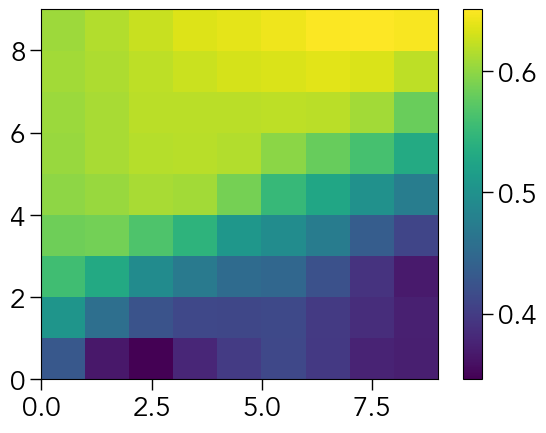

In [659]:
plt.pcolor(temp_corr)
plt.colorbar()

In [1008]:
l = 2  # Grid size parameter

lat  = (sbk_1h['latitude'].values*4).round(0)/4
lon  = (sbk_1h['longitude'].values*4).round(0)/4
time = sbk_1h['time'].values

# Create an empty array to store the ERA5 temperature data
era5grid = []
era5var = np.zeros(( len(sbk_1h.time),2 * dl * 4 + 1, 2 * dl * 4 + 1))

# Iterate over the time values in sbk_1h
for i in range(len(sbk_1h.time.values)):
    
    # Retrieve the ERA5 data for the corresponding time, longitude, and latitude
    era5_data = era5.sel(time=sbk_1h.time[i].values)
    era5_data = era5_data.sel(longitude=slice(lon[i] - dl, lon[i] + dl)).sel(latitude=slice(lat[i] + dl, lat[i] - dl))
    
    # Store the ERA5 data in the era5temp array
    era5grid.append(era5_data[['longitude','latitude']])
    era5var[i,:,:] = era5_data['wind_speed'].values

KeyError: 'wind_speed'

In [1030]:
era5_data

<xarray.Dataset>
Dimensions:    (longitude: 17, latitude: 17)
Coordinates:
  * longitude  (longitude) float32 14.0 14.25 14.5 14.75 ... 17.5 17.75 18.0
  * latitude   (latitude) float32 -35.25 -35.5 -35.75 ... -38.75 -39.0 -39.25
    time       datetime64[ns] 2023-03-06T11:00:00
Data variables:
    u10        (latitude, longitude) float32 -3.98 -4.353 -4.823 ... 1.613 1.584
    v10        (latitude, longitude) float32 8.094 8.624 9.041 ... 5.838 5.813
    t2m        (latitude, longitude) float32 18.18 18.16 18.18 ... 17.77 17.71
    bld        (latitude, longitude) float32 6.947e+03 8.065e+03 ... 3.552e+03
    blh        (latitude, longitude) float32 1.253e+03 1.206e+03 ... 946.1 950.1
    i10fg      (latitude, longitude) float32 11.95 12.78 13.54 ... 9.517 9.56
    msl        (latitude, longitude) float32 1.024e+05 1.024e+05 ... 1.023e+05
    mslhf      (latitude, longitude) float32 -230.2 -227.5 ... -194.0 -196.5
    msshf      (latitude, longitude) float32 -34.05 -37.66 ... -29.3 -31.9
    sst        (latitude, longitude) float32 20.62 20.63 20.93 ... 20.53 20.73
    skt        (latitude, longitude) float32 20.36 20.4 20.7 ... 20.22 20.41
    sp         (latitude, longitude) float32 1.025e+05 1.024e+05 ... 1.023e+05
Attributes:
    Conventions:  CF-1.6
    history:      2023-06-04 12:46:26 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [ ]:
l = 2  # Grid size parameter

lat  = (sbk_1h['latitude'].values*4).round(0)/4
lon  = (sbk_1h['longitude'].values*4).round(0)/4
time = sbk_1h['time'].values

# Create an empty array to store the ERA5 temperature data
era5grid = []
era5var = np.zeros(( len(sbk_1h.time),2 * dl * 4 + 1, 2 * dl * 4 + 1))

# Iterate over the time values in sbk_1h
for i in range(len(sbk_1h.time.values)):
    
    # Retrieve the ERA5 data for the corresponding time, longitude, and latitude
    era5_data = era5.sel(time=sbk_1h.time[i].values)
    era5_data = era5_data.sel(longitude=slice(lon[i] - dl, lon[i] + dl)).sel(latitude=slice(lat[i] + dl, lat[i] - dl))
    
    # Store the ERA5 data in the era5temp array
    era5grid.append(era5_data[['longitude','latitude']])
    era5var[i,:,:] = era5_data['wind_speed'].values

grid = np.zeros(np.shape(era5var))  # Create an empty grid for storing distances
var_corr = np.zeros(np.shape(era5var))  # Create an empty grid for storing correlation factors

# Loop over latitude
for i in tqdm(range(grid.shape[1]), desc='Latitude', total=grid.shape[1]):
    
    # Loop over longitude
    for j in tqdm(range(grid.shape[2]), desc='Longitude', total=grid.shape[2], leave=False):
        
        # Loop over time
        for t in np.arange(12,len(time) - 12, 1):
            
            # Calculate the correlation factor between the temperature at the current point and the temperature at the central point
            var_corr[t, i, j], _ = pearsonr(
                era5var[t - 12: t + 13, i, j],
                era5var[t - 12: t + 13],
            )
            
            # Calculate the distance between the current point and the central point using gsw.distance
            distance = gsw.distance([lon[t+12], era5grid[t+12].isel(longitude=j)['longitude'].values], [lat[t+12], era5grid[t+12].isel(latitude=i)['latitude'].values]) / 1000

            # Store the distance in the grid array
            grid[t, i, j] = distance

        # Calculate the mean of correlation factors over time
        var_corr_mean = np.mean(var_corr, axis=0)
        grid_mean = np.mean(grid, axis=0)

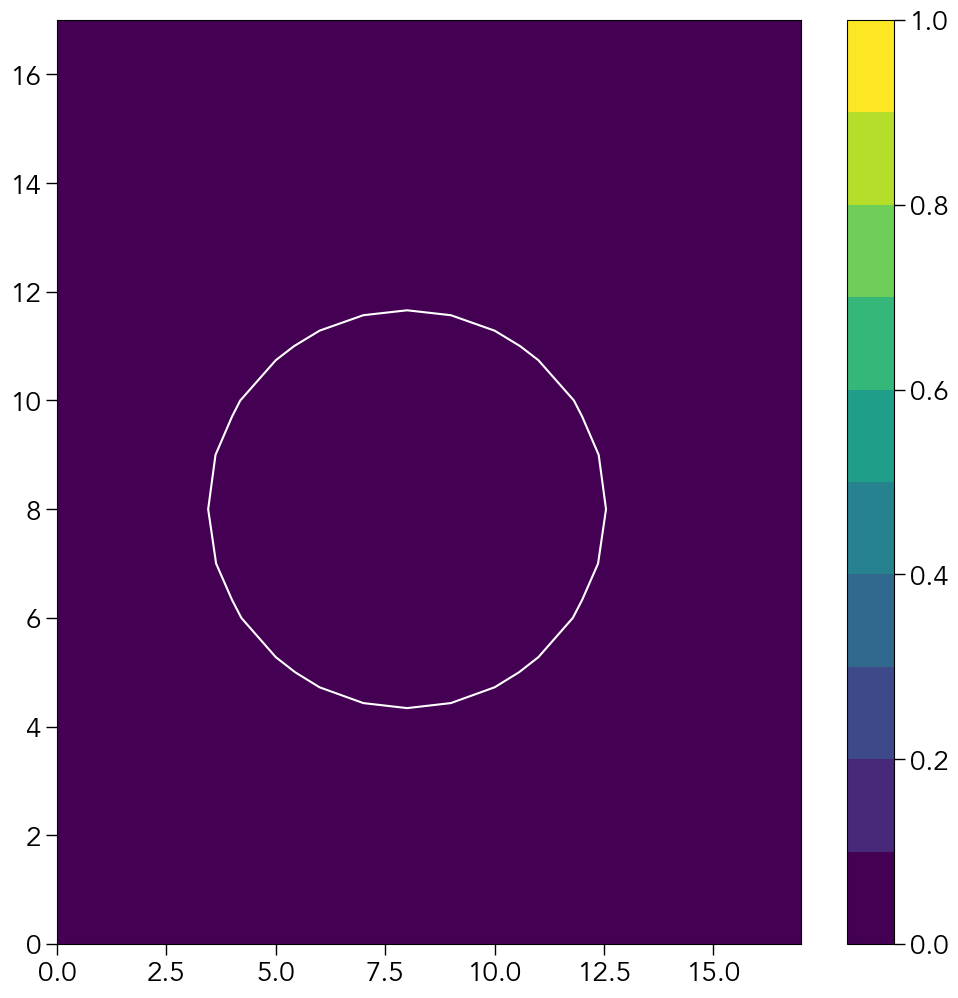

In [1017]:
fig,ax = plt.subplots(figsize=(12,12))

pcm = plt.pcolor(var_corr_mean**2,cmap=plt.get_cmap('viridis',10),vmin=0,vmax=1)

plt.contour(grid_mean,levels = [100],colors='w')

# cnt = plt.contour(np.arange(15 - dl, 15 + dl+ 0.1, 0.25),np.arange(-37 - dl,-37 + dl + 0.1,0.25),grid,levels=[50],colors='w')

plt.colorbar(pcm) 

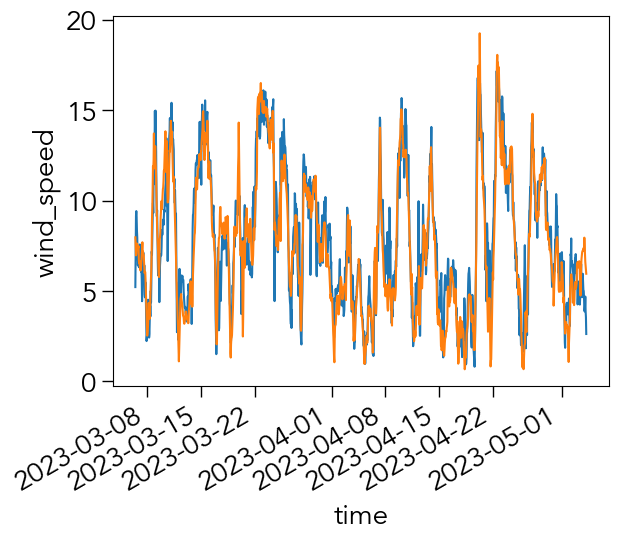

In [1007]:
sbk_1h['ws10'].plot()
era5_k['wind_speed'].plot()

In [1018]:
l = 2  # Grid size parameter

central_lat = -37  # Central latitude
central_lon = 15  # Central longitude

# Select the subset of data based on the specified grid size and central coordinates
era5grid = era5.sel(time=sbk_1h.time.values)
era5grid = era5grid.sel(longitude=slice(central_lon - l, central_lon + l)).sel(latitude=slice(central_lat + l, central_lat - l))

lon_grid = era5grid['longitude'].values  # Extract longitude values from the grid
lat_grid = era5grid['latitude'].values  # Extract latitude values from the grid

era5var = era5grid['t2m'].values  # Extract the temperature variable values from the grid

grid = np.zeros((2 * l * 4 + 1, 2 * l * 4 + 1))  # Create an empty grid for storing distances
var_corr = np.zeros((len(era5grid.time.values) - 24, 2 * l * 4 + 1, 2 * l * 4 + 1))  # Create an empty grid for storing correlation factors

# Loop over latitude
for i, y in tqdm(enumerate(lat_grid),):
    # Loop over longitude
    for j, x in enumerate(lon_grid):
        # Loop over time
        for t in range(len(era5grid.time.values) - 24):
            # Calculate the correlation factor between the temperature at the current point and the temperature at the central point
            var_corr[t, i, j], _ = pearsonr(
                era5var[t + 11: t + 24, i, j],
                era5var[t + 11: t + 24, int(((2 * l * 4 + 1) - 1) / 2), int(((2 * l * 4 + 1) - 1) / 2)],
            )

        # Calculate the mean of correlation factors over time
        var_corr_mean = np.mean(var_corr, axis=0)

        # Calculate the distance between the current point and the central point using gsw.distance
        distance = gsw.distance([central_lon, x], [central_lat, y]) / 1000

        # Store the distance in the grid array
        grid[i, j] = distance

In [ ]:
var_corr_mean

In [1034]:
grid

array([[286.03812152, 272.45826193, 260.11601531, 249.19542732,
        239.89080814, 232.39640244, 226.89171074, 223.52381991,
        222.38985329, 223.52381991, 226.89171074, 232.39640244,
        239.89080814, 249.19542732, 260.11601531, 272.45826193,
        286.03812152],
       [264.81228384, 250.12966598, 236.66885199, 224.64967425,
        214.31490483, 205.91838773, 199.7048107 , 195.88206184,
        194.59112163, 195.88206184, 199.7048107 , 205.91838773,
        214.31490483, 224.64967425, 236.66885199, 250.12966598,
        264.81228384],
       [244.90492615, 229.00093329, 214.26447036, 200.95266556,
        189.36630077, 179.8392604 , 172.71273364, 168.29200498,
        166.79238997, 168.29200498, 172.71273364, 179.8392604 ,
        189.36630077, 200.95266556, 214.26447036, 229.00093329,
        244.90492615],
       [226.66371246, 209.43552098, 193.26586538, 178.44285915,
        165.32922351, 154.36132742, 146.02355715, 140.78404894,
        138.99365831, 140.78404894,

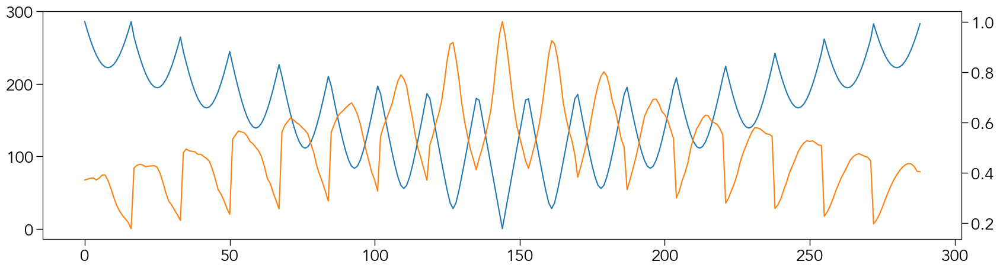

In [1182]:
fig, ax = plt.subplots(figsize=(20,5)) 
ax.plot((grid.flatten()))
ax.twinx().plot(var_corr_mean.flatten(),c='C1')

In [1209]:
np.random.rand(len(idx))

array([0.21123206, 0.17818124, 0.60058275])

In [1200]:
np.random.randint(len(idx)) + i - 1

26

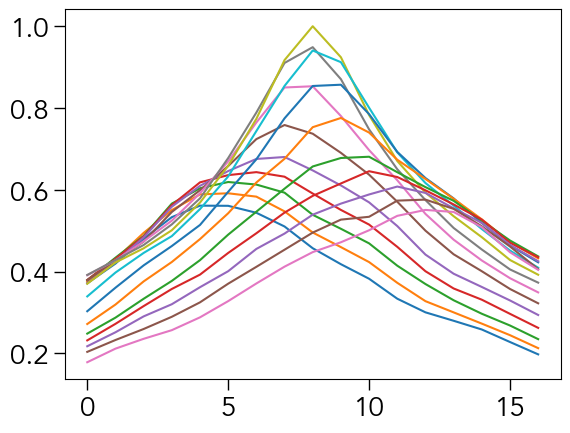

In [1230]:
plt.plot(var_corr_mean)

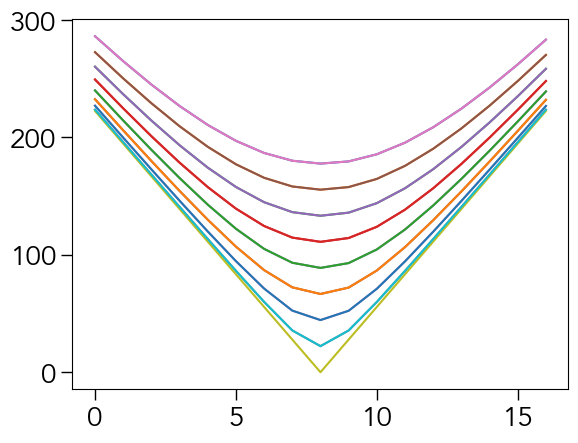

In [1231]:
plt.plot(grid)

In [1234]:
np.where((flat_grid >=  25) & (flat_grid < 50))[0]

array([126, 127, 128, 142, 146, 160, 161, 162])

In [1235]:
np.where((flat_grid >=  50) & (flat_grid < 75))[0]

array([108, 109, 110, 111, 112, 124, 125, 129, 130, 141, 147, 158, 159,
       163, 164, 176, 177, 178, 179, 180])

In [1222]:
var_corr_mean.flatten()[((flat_grid >=  100) & (flat_grid < 125))]

array([0.59165195, 0.5790872 , 0.56877895, 0.55283158, 0.51408665,
       0.64586879, 0.6581741 , 0.5426807 , 0.49040943, 0.64324067,
       0.67548548, 0.54651717, 0.49378586, 0.63210476, 0.54429483,
       0.59094655, 0.58523095, 0.55084467, 0.61557484, 0.51504023,
       0.56934276, 0.68088172, 0.64547453, 0.51142247, 0.57092313,
       0.67358151, 0.64312618, 0.54109417, 0.5749341 , 0.59328833,
       0.6166365 , 0.62882147])

In [1226]:
[((flat_grid >=  100) & (flat_grid < 125))]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False,  True,  True,  True,  True,  True, False, False,
        False, False, False, False, False, False, False, False,  True,
         True, False, False, False, False, False,  True,  True, False,
        False, False, False, False, False, False,  True,  True, False,
        False, False, False, False, False, False,  True,  True, False,
        False, False, False, False, False,  True, False, False, False,
      

In [1225]:
var_corr_mean.flatten()[((flat_grid >=  100) & (flat_grid < 125))]

array([0.59165195, 0.5790872 , 0.56877895, 0.55283158, 0.51408665,
       0.64586879, 0.6581741 , 0.5426807 , 0.49040943, 0.64324067,
       0.67548548, 0.54651717, 0.49378586, 0.63210476, 0.54429483,
       0.59094655, 0.58523095, 0.55084467, 0.61557484, 0.51504023,
       0.56934276, 0.68088172, 0.64547453, 0.51142247, 0.57092313,
       0.67358151, 0.64312618, 0.54109417, 0.5749341 , 0.59328833,
       0.6166365 , 0.62882147])

  0%|          | 0/100 [00:00<?, ?it/s]

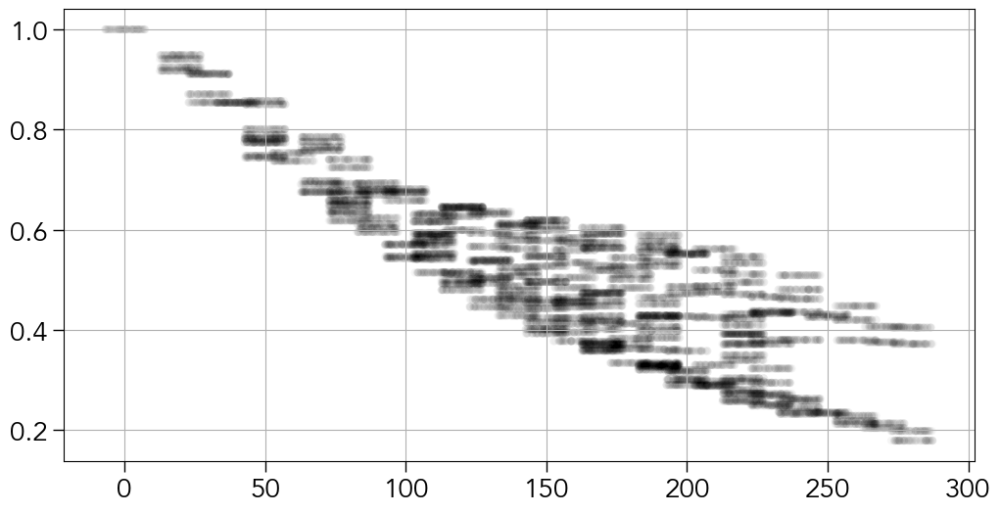

In [1250]:
fig, ax = plt.subplots(figsize=(12,6))

da = 10

for j in tqdm(range(100)):
    
    for i in np.arange(0,300,da):

        idx = np.where((flat_grid >= i) & (flat_grid < i + da))[0]

        if len((idx)) > 0:

            ax.scatter(np.random.rand(len(var_corr[j,:,:].flatten()[idx]))*15 + i - 7.5,var_corr_mean.flatten()[idx],c='k',alpha=0.02, ec=None)

ax.grid()

In [1186]:
grid.flatten()[np.where((var_corr_mean > 0.8).flatten())[0]]

array([52.44789924, 35.59878499, 27.79873166, 35.59878499, 44.40205745,
       22.20104786,  0.        , 22.20104786, 44.40205745, 35.55323147,
       27.79873166, 35.55323147, 52.3241552 , 59.83904008])

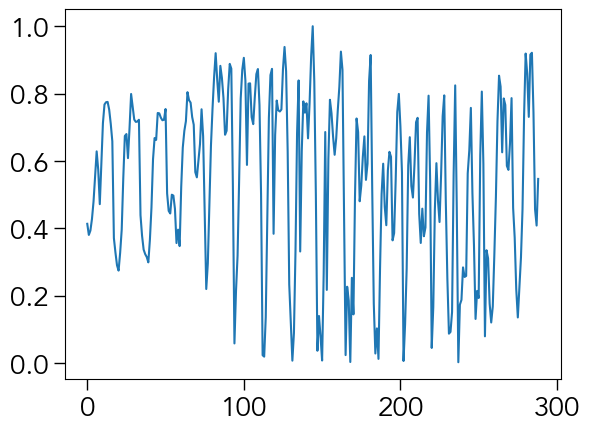

In [1174]:
plt.plot(((var_corr[0,:,:]**2).flatten()))


In [1311]:
str(0).zfill(4)

'0000'

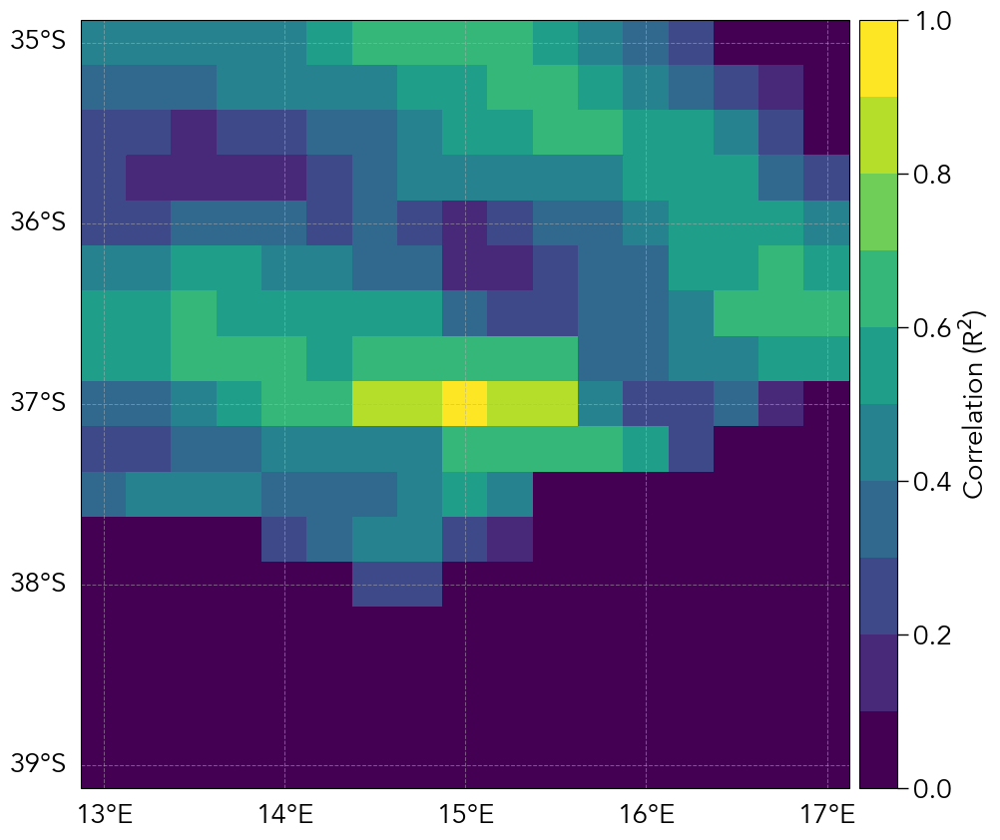

In [1330]:

fig,ax = plt.subplots(figsize=(12,10),subplot_kw=dict(projection=ccrs.PlateCarree()))
pcm = ax.pcolor(lon_grid,lat_grid,var_corr[i,:,:],vmin=0,vmax=1,cmap=plt.get_cmap('viridis',10))
gridlines(ax,1,1)
plt.colorbar(pcm,label='Correlation (R$^{2}$)',pad=0.01)

In [1331]:
for i in tqdm(range(var_corr.shape[0])):

    fig,ax = plt.subplots(figsize=(12,10),subplot_kw=dict(projection=ccrs.PlateCarree()))
    pcm = ax.pcolor(lon_grid,lat_grid,var_corr[i,:,:],vmin=0,vmax=1,cmap=plt.get_cmap('viridis',10))
    gridlines(ax,1,1)
    plt.colorbar(pcm,label='Correlation (R$^{2}$)',pad=0.01)    
    
    plt.savefig('/Users/xedhjo/Documents/Projects/2023_Validating_Sailbuoy/figures/gifs/decorr/'+str(i).zfill(4)+'.png')
    plt.close()

  0%|          | 0/1386 [00:00<?, ?it/s]

In [7]:
import imageio

In [8]:
def gifmaker(impath,savepath,duration):

    filenames = []
    for file in glob.glob(impath): # Specify where the images at
        filenames.append(file)
    filenames.sort(key=os.path.getmtime)

    images = list(map(lambda filename: imageio.imread(filename), filenames))

    imageio.mimsave(os.path.join(savepath), images, duration = duration) # modify duration as needed

In [9]:
gifmaker(f'/Users/xedhjo/Documents/Projects/2023_Validating_Sailbuoy/figures/gifs/decorr/*.png',
             f'/Users/xedhjo/Documents/Projects/2023_Validating_Sailbuoy/figures/correlation.gif',
             0.1)

/var/folders/kv/12hx37w96j39x9h5z7hw8hy40000gn/T/ipykernel_78517/2352723904.py:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = list(map(lambda filename: imageio.imread(filename), filenames))


In [1256]:
grid.shape

(17, 17)

In [1257]:
var_corr.shape

(1386, 17, 17)

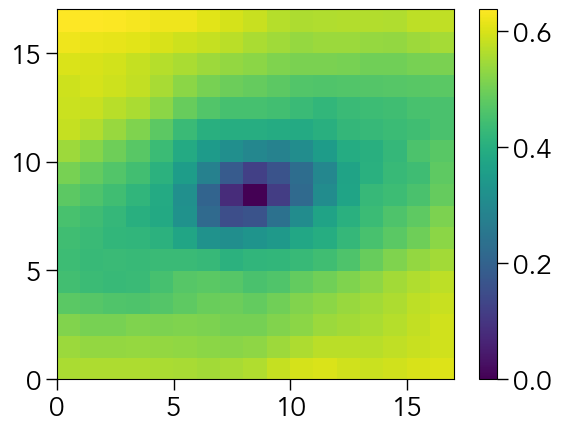

In [1272]:
plt.pcolor(np.std(var_corr,axis=0))
plt.colorbar()

In [1301]:
maxs     = []
mins     = []
means    = []
stds  =    []
# medians  = []
lim = 0.9
for i in range(1386):
    
    maxs.append(grid.flatten()[np.where(var_corr[i,:,:].flatten() > lim)[0]].max())
    mins.append(grid.flatten()[np.where(var_corr[i,:,:].flatten() > lim)[0]].min())
    means.append(grid.flatten()[np.where(var_corr[i,:,:].flatten() > lim)[0]].mean())
    stds.append(grid.flatten()[np.where(var_corr[i,:,:].flatten() > lim)[0]].std())
    # medians.append(grid.flatten()[np.where(var_corr[i,:,:].flatten() > 0.8)[0]].median())
    
    
    

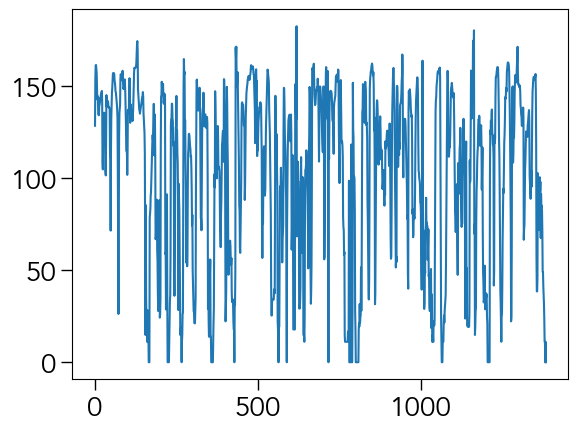

In [1302]:
plt.plot(means)

In [1303]:
np.mean(means)

102.30919095472834

In [1304]:
np.std(means)

48.186844925878894

In [1305]:
np.mean(stds)

54.26803988045812

In [1306]:
np.std(stds)

22.36037696366281

In [ ]:
aaa

In [1191]:
flat_grid = grid.flatten()
flat_corr = (var_corr**2).flatten()

In [1172]:
flat_grid.shape


(404600,)

In [1108]:
X.astype(np.float32)

array([[1.6781436e+18, 1.6781472e+18, 1.6781508e+18, ..., 1.6831224e+18,
        1.6831259e+18, 1.6831297e+18],
       [1.6781436e+18, 1.6781472e+18, 1.6781508e+18, ..., 1.6831224e+18,
        1.6831259e+18, 1.6831297e+18],
       [1.6781436e+18, 1.6781472e+18, 1.6781508e+18, ..., 1.6831224e+18,
        1.6831259e+18, 1.6831297e+18],
       ...,
       [1.6781436e+18, 1.6781472e+18, 1.6781508e+18, ..., 1.6831224e+18,
        1.6831259e+18, 1.6831297e+18],
       [1.6781436e+18, 1.6781472e+18, 1.6781508e+18, ..., 1.6831224e+18,
        1.6831259e+18, 1.6831297e+18],
       [1.6781436e+18, 1.6781472e+18, 1.6781508e+18, ..., 1.6831224e+18,
        1.6831259e+18, 1.6831297e+18]], dtype=float32)

In [ ]:
var_corr

In [1106]:
print(f'X dtype:, {X.dtype}')
print(f'Y dtype:, {Y.dtype}')
print(f'Z dtype:, {Z.dtype}')

<span style='font-size: 20px;'>X dtype:, datetime64[ns]</span>

<span style='font-size: 20px;'>Y dtype:, float32</span>

<span style='font-size: 20px;'>Z dtype:, float64</span>

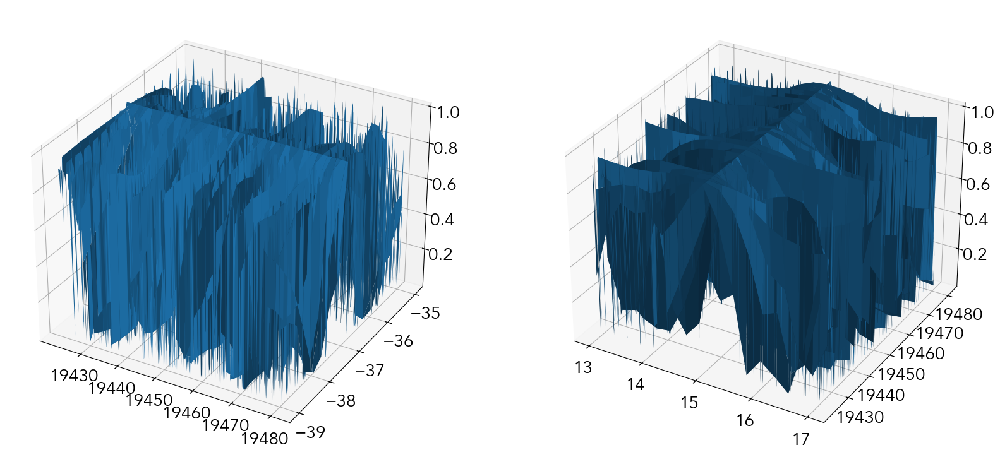

In [1115]:
fig, (ax,bx) = plt.subplots(1,2,figsize=(20, 10), subplot_kw={"projection": "3d"})

X, Y = np.meshgrid(mdates.date2num(time[12:-12]), lat_grid)

Z = (var_corr**2)[:,:,8]

# Convert Z to a NumPy array
Z = np.array(Z)

# Plot the surface
ax.plot_surface(X.T, Y.T, Z)

X, Y = np.meshgrid(lon_grid, mdates.date2num(time[12:-12]))

Z = (var_corr**2)[:,8,:]

# Convert Z to a NumPy array
Z = np.array(Z)

# Plot the surface
bx.plot_surface(X.T, Y.T, Z.T)

In [1117]:
grid

array([[286.03812152, 272.45826193, 260.11601531, 249.19542732,
        239.89080814, 232.39640244, 226.89171074, 223.52381991,
        222.38985329, 223.52381991, 226.89171074, 232.39640244,
        239.89080814, 249.19542732, 260.11601531, 272.45826193,
        286.03812152],
       [264.81228384, 250.12966598, 236.66885199, 224.64967425,
        214.31490483, 205.91838773, 199.7048107 , 195.88206184,
        194.59112163, 195.88206184, 199.7048107 , 205.91838773,
        214.31490483, 224.64967425, 236.66885199, 250.12966598,
        264.81228384],
       [244.90492615, 229.00093329, 214.26447036, 200.95266556,
        189.36630077, 179.8392604 , 172.71273364, 168.29200498,
        166.79238997, 168.29200498, 172.71273364, 179.8392604 ,
        189.36630077, 200.95266556, 214.26447036, 229.00093329,
        244.90492615],
       [226.66371246, 209.43552098, 193.26586538, 178.44285915,
        165.32922351, 154.36132742, 146.02355715, 140.78404894,
        138.99365831, 140.78404894,

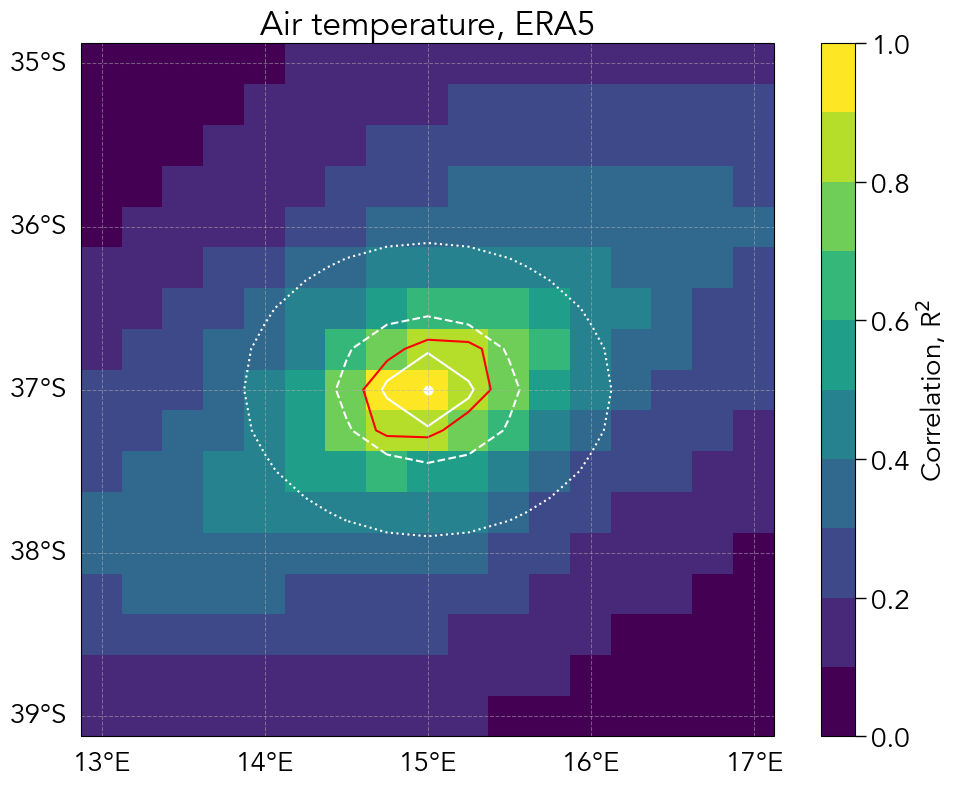

In [1027]:
fig,ax = plt.subplots(figsize=(12,9),subplot_kw=dict(projection=ccrs.PlateCarree()))
pcm = plt.pcolor(np.arange(15 - dl, 15 + dl+ 0.1, 0.25),np.arange(-37 - dl,-37 + dl + 0.1,0.25),var_corr_mean**2,cmap=plt.get_cmap('viridis',10),vmin=0,vmax=1)
plt.contour(np.arange(15 - dl, 15 + dl+ 0.1, 0.25),np.arange(-37 - dl,-37 + dl + 0.1,0.25),var_corr_mean**2,levels=[0.8],colors='r')
cnt = plt.contour(np.arange(15 - dl, 15 + dl+ 0.1, 0.25),np.arange(-37 - dl,-37 + dl + 0.1,0.25),grid,levels=[25,50,100],colors='w',linestyles=['-','--',':'])
plt.scatter(15,-37,c='w')
plt.colorbar(pcm,label='Correlation, R$^{2}$')
ax.set_title('Air temperature, ERA5')
gridlines(ax,1,1)

In [1031]:
ds

<xarray.Dataset>
Dimensions:  (time: 3629)
Coordinates:
  * time     (time) datetime64[ns] 2023-03-05 ... 2023-03-30T04:40:00
    doy      (time) float64 62.0 62.01 62.01 62.02 ... 87.17 87.18 87.19 87.19
Data variables: (12/104)
    #Time    (time) float64 479.5 1.48e+03 2.48e+03 ... 4.348e+04 4.416e+04
    AT       (time) float64 21.29 21.27 21.3 21.35 ... 16.58 16.55 16.68 16.9
    BP       (time) float64 1.008e+03 1.008e+03 ... 1.018e+03 1.018e+03
    BS       (time) float64 1.01e+03 1.01e+03 1.01e+03 ... 1.02e+03 1.02e+03
    PR       (time) float64 29.5 29.5 29.51 29.52 ... 49.85 49.83 49.8 49.8
    RH       (time) float64 87.39 87.91 87.63 87.14 ... 80.2 80.64 80.79 80.35
    ...       ...
    SA-4     (time) float64 35.56 35.53 35.51 35.5 ... 17.05 17.02 17.01 17.0
    SL       (time) float64 7.608 7.761 7.725 7.854 ... -99.0 -99.0 -99.0 -99.0
    SX       (time) float64 0.5666 0.5174 0.5549 0.4649 ... -99.0 -99.0 -99.0
    mday     (time) float64 0.0 0.006944 0.01389 0.02083 ... 25.18 25.19 25.19
    ws10     (time) float64 5.082 5.146 4.838 4.872 ... 1.138 2.249 4.037 6.782
    hrw      (time) float64 108.9 113.6 110.7 114.4 ... 34.64 120.8 130.4 118.7

In [890]:
l = 2
central_lat = -37
central_lon = 15

era5grid = era5.sel(time=sbk_1h.time.values)
era5grid = era5grid.sel(longitude=slice(central_lon - l, central_lon + l)).sel(latitude=slice(central_lat + l, central_lat - l))

lon_grid = era5grid['longitude'].values
lat_grid = era5grid['latitude'].values

era5var = era5grid['t2m'].values

grid = np.zeros((2 * l * 4 + 1, 2 * l * 4 + 1))
var_corr = np.zeros((len(era5grid.time.values) - 24, 2 * l * 4 + 1, 2 * l * 4 + 1))

for i, y in tqdm(enumerate(lat_grid), desc='Latitude', total=len(lat_grid)):
    for j, x in tqdm(enumerate(lon_grid), desc='Longitude', total=len(lon_grid), leave=False):
        for t in range(len(era5grid.time.values) - 24):
            var_corr[t, i, j], _ = pearsonr(
                era5var[t + 11 : t + 24, i, j],
                era5var[t + 11 : t + 24, int(((2 * l * 4 + 1) - 1) / 2), int(((2 * l * 4 + 1) - 1) / 2)],
            )
        
        var_corr_mean = np.mean(var_corr, axis=0)  # Calculate the mean correlation across time axis
        
        distance = gsw.distance([central_lon, x], [central_lat, y]) / 1000
        grid[i, j] = distance

TypeError: object of type 'numpy.float32' has no len()

In [799]:
"""
In this code, the grid variable represents a 2D array that will store the calculated distances. 
The code iterates over the lat_grid and lon_grid arrays, and for each combination of latitude and longitude, it calculates the distance between the coordinates specified by lon[150] and x, and lat[150] and y. 
The calculated distance is then stored in the corresponding position in the grid array.

Please note that you may need to adjust the code based on the availability and dimensions of the lat_grid, lon_grid, lon, and lat variables in your actual implementation. 
Additionally, ensure that you have the necessary dependencies installed, such as the gsw package for the gsw.distance function.
"""

# Create an empty grid
grid = np.zeros((temp_corr.shape[0],temp_corr.shape[0]))

# Iterate over the lat_grid and lon_grid arrays
for i, y in enumerate(lat_grid):
    for j, x in enumerate(lon_grid):
        # Calculate the distance between two coordinates using gsw.distance
        distance = gsw.distance([lon[150], x], [lat[150], y]) / 1000
        
        # Store the distance in the grid array
        grid[i, j] = distance


In [813]:
temp_corr

array([[-0.55833801, -0.49393234, -0.44782657, ...,  0.34363215,
        -0.05998593, -0.20370247],
       [-0.46156904, -0.37807075, -0.32636526, ...,  0.47861329,
        -0.02993056, -0.30450781],
       [-0.39393349, -0.32313198, -0.27646821, ...,  0.58049268,
         0.03964173, -0.34751058],
       ...,
       [-0.36838774, -0.15057521,  0.19739477, ...,  0.7535496 ,
         0.71181816,  0.67752129],
       [-0.40513951, -0.32431693,  0.01848077, ...,  0.68839949,
         0.65315947,  0.63035207],
       [-0.61722932, -0.48836191, -0.08138157, ...,  0.69178262,
         0.67977492,  0.66042995]])

In [801]:
grid.shape

(49, 41)

In [802]:
temp_corr.shape

(41, 41)

In [812]:
int(41/2)

20

In [837]:
import numpy as np
from scipy.optimize import curve_fit

def covariance(lag_distance, paired_observations):
    # Calculate covariance based on Equation 1
    # lag_distance: array of lag distances
    # paired_observations: array of paired observations
    # Returns: covariance values
    
    # Implementation of Equation 1 to calculate covariance
    
    return covariance_values

def gaussian_func(lag_distance, covariance_amplitude, covariance_at_0, e_folding_scale):
    # Gaussian function based on Equation 2
    # lag_distance: array of lag distances
    # covariance_amplitude, covariance_at_0, e_folding_scale: Gaussian function parameters
    # Returns: fitted Gaussian function values
    
    # Implementation of Equation 2 to calculate fitted Gaussian function
    
    return fitted_gaussian_values

In [839]:
# Sample data
lag_distance = np.array([2.5, 7.5, 12.5, 17.5])  # Example lag distances
paired_observations = np.array([0.1, 0.2, 0.3, 0.4])  # Example paired observations

In [841]:
covariance(lag_distance, paired_observations)

NameError: name 'covariance_values' is not defined

In [858]:
import xarray as xr
import numpy as np
from scipy.spatial.distance import cdist

era5_ds = era5.sel(time=sbk_1h.time.values).isel(latitude=slice(0,41))
sailbuoy_ds = sbk_1h.sel(time=sbk_1h.time.values)


# Extract air temperature variables from both datasets
satellite_air_temp = era5_ds['t2m']
sailbuoy_air_temp = sailbuoy_ds['air_temp']

# Determine the maximum time difference (in this example, set to 1 day)
max_time_diff = 1  # Adjust according to your requirements

# Extract the starting Sailbuoy coordinates
start_sailbuoy_lat = sailbuoy_ds['latitude'][0]
start_sailbuoy_lon = sailbuoy_ds['longitude'][0]

# Calculate the distances between the starting Sailbuoy coordinate and all satellite data points
satellite_coords = np.column_stack((era5_ds['latitude'].values.ravel(), era5_ds['longitude'].values.ravel()))
sailbuoy_coords = np.array([[start_sailbuoy_lat, start_sailbuoy_lon]])
distances = cdist(sailbuoy_coords, satellite_coords, metric='euclidean')[0]

# Initialize arrays to store covariance and lag distances
covariances = []
lag_distances = []

# Iterate over each lag distance
for lag_distance in np.arange(0, np.max(distances), 1.0):
    # Find the indices where the time difference is within the specified maximum
    valid_indices = np.where((distances <= lag_distance) & (np.abs(era5_ds['time'].values - sailbuoy_ds['time'].values) <= np.timedelta64(max_time_diff, 'D')))

    # Extract the corresponding air temperature values
    valid_satellite_air_temp = satellite_air_temp.isel(time=valid_indices)
    valid_sailbuoy_air_temp = sailbuoy_air_temp.isel(time=valid_indices)

    # Compute the covariance between the air temperature variables
    covariance = np.cov(valid_satellite_air_temp, valid_sailbuoy_air_temp)[0, 1]

    # Store the covariance and lag distance
    covariances.append(covariance)
    lag_distances.append(lag_distance)

# Find the lag distance where covariance drops below a threshold (e.g., 0.3 times the maximum covariance)
threshold = 0.3 * np.max(covariances)
decorrelation_distance = lag_distances[np.where(np.array(covariances) < threshold)[0][0]]

# Print the decorrelation distance
print(f"The spatial decorrelation distance is approximately {decorrelation_distance:.2f} units (e.g., kilometers).")


ValueError: operands could not be broadcast together with shapes (41,) (1410,) 

In [862]:
distances

array([8.23092639, 7.89060066, 7.55149048, 7.21376726, 6.87763533,
       6.54333992, 6.21117758, 5.88150972, 5.55478048, 5.23154048,
       4.91247854, 4.59846442, 4.29060656, 3.9903301 , 3.69948157,
       3.42046686, 3.1564257 , 2.91143483, 2.69070296, 2.50066232,
       2.3487745 , 2.24280434, 2.18942936, 2.19249414, 2.25176823,
       2.36302556, 2.5193887 , 2.71307004, 2.9366952 , 3.1839611 ,
       3.4497881 , 3.73021012, 4.02217568, 4.32334671, 4.63192794,
       4.94653273, 5.26608162, 5.58972676, 5.916796  , 6.24675152,
       6.57915908])